# CASA Summary
The pipeline used for calibration and flagging closely follows that of the CASA pipeline (https://casaguides.nrao.edu/index.php?title=VLA-S-CASA_Pipeline-CASA6.2.1#Stage_7._hifv_checkflag:_Flag_possible_RFI_on_BP_calibrator_using_rflag). This notebook summarises the output of the pipeline (calibration tables, flagging summaries, data plots) and can be used to get an overview of the data and identify bad data that needs to be flagged manually.

In [1]:
import os
import sys
import h5py
import yaml
import casatasks
import numpy as np
from astropy.time import Time
import astropy.units as u
from ipywidgets import interact

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib as mpl

cmap = mpl.cm.viridis  
cmap.set_bad(color='red')

from IPython.display import Image

# read yaml file
with open("../input/config.yaml", "r") as file:
    conf = yaml.safe_load(file)
    
sys.path.append(os.path.join(os.curdir, "../"))

from vlapy import vladata, inspect

## Obervation Information 
The data below is the output of CASA's listobs task and can be used to fill in the yaml file "obs.yaml", which contains all the parameters for the pipeline.

In [2]:
obs = conf["obs list"][10]
root = os.path.join(conf["root"], f"{obs}")
name = obs.split(".")[0]

ms = os.path.join(root, f"{obs}_hanning.ms")
print(obs)
vladata.listobs(ms)

19A-056.sb37162490.eb37257813.58741.17455034722
BeginTime
58741.17456018519 

EndTime
58741.32585648147 

IntegrationTime
13071.999999046326 

field_0
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': 0.426245723}, 'm1': {'unit': 'rad', 'value': 0.5787469766000002}, 'refer': 'J2000', 'type': 'direction'}
name :  3C48


field_1
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -0.8720266447795864}, 'm1': {'unit': 'rad', 'value': -0.4385947582}, 'refer': 'J2000', 'type': 'direction'}
name :  J2040-2507


field_10
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -0.18192512177958636}, 'm1': {'unit': 'rad', 'value': -0.545058326}, 'refer': 'J2000', 'type': 'direction'}
name :  QSO J2318-3113


field_11
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -0.049935324379586164}, 'm1': {'unit': 'rad', 'value': -0.5393563838}, 'refer': 'J2000', 'type': 'direction'}
name :  QSO J2348-3054


field_12
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -0.0961

### Array Layout

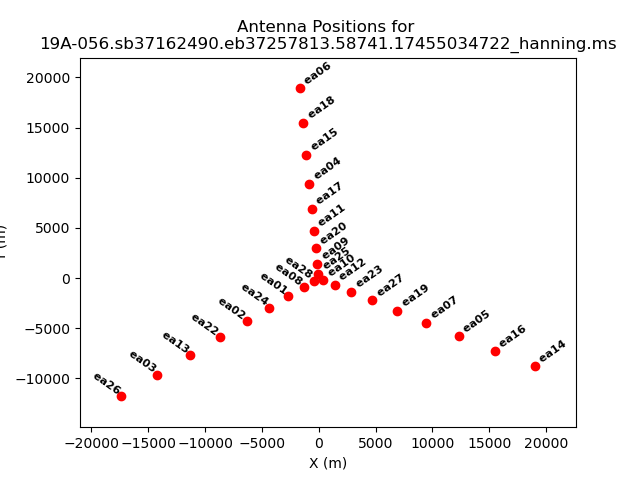

In [3]:
Image(filename=root + "/plots/obsplots/antlayout.png")

### Plot Elevation vs. Time
Observations low in elevation might see more RFI. The plot is colorised by field. Each target field is in between two phase calibrators.

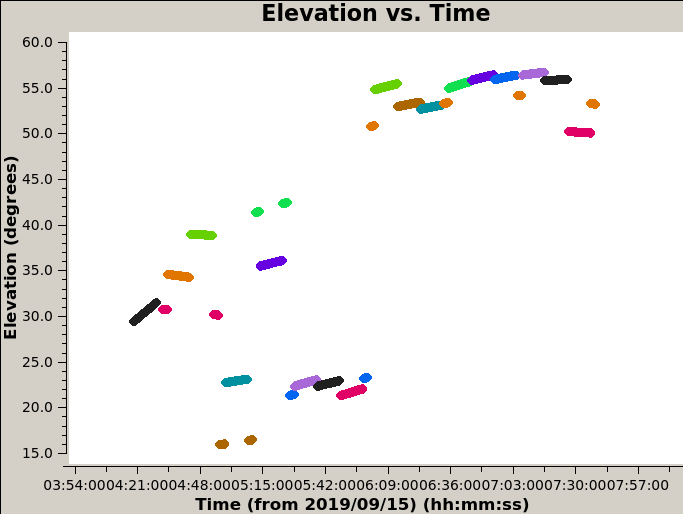

In [4]:
Image(filename=root + "/plots/obsplots/elevation_vs_time.png")

## VLA Deterministic Flags and Manual Flags
These include antennas not on source, shadowed antennas, scans with non-relevant intents, autocorrelations, edge channels of spectral windows, edge channels of the baseband, clipping absolute zero values produced by the correlator and the first few integrations of a scan (quacking). Manual flags are also applied for data known to be bad (RFI, obs reports). Below is a summary of the flags before and after applying the deterministic flags. Use the flagging frequency to find a suitable reference antenna and specify it in the yaml file.

In [5]:
summary_before = np.load(root + "/output/detflag_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + "/output/detflag_summary_after.npy", allow_pickle='TRUE').item()

# print flagging summary
def print_summary(item):
    for subitem in summary_before[item]:
        print(f"{item} {subitem}")
        print(
            "Before: {:.4f}, After: {:.4f}".format(
                100.0 * summary_before[item][subitem]["flagged"] / summary_before[item][subitem]["total"],
                100.0 * summary_after[item][subitem]["flagged"] / summary_after[item][subitem]["total"],
            )
        )
        print("")
        
print("Flag occupancy (percent) before and after deterministic flags:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after deterministic flags:

field 3C48
Before: 36.3983, After: 43.2594

field J2040-2507
Before: 43.9068, After: 49.4725

field J2214-3835
Before: 20.9720, After: 28.8141

field J2246-1206
Before: 28.8927, After: 35.9494

field J2314-3138
Before: 24.3855, After: 31.8891

field J2337-0230
Before: 20.5780, After: 28.4575

field QSO J0001+0000
Before: 5.6214, After: 14.9825

field QSO J0001+0006
Before: 3.7935, After: 13.6173

field QSO J0004-0049
Before: 3.7935, After: 13.6350

field QSO J2032-2114
Before: 5.0261, After: 14.4451

field QSO J2100-1715
Before: 5.4286, After: 14.8079

field QSO J2211-3206
Before: 6.1718, After: 15.4778

field QSO J2240-1839
Before: 6.8251, After: 16.0786

field QSO J2315-0023
Before: 5.1048, After: 14.5159

field QSO J2318-0246
Before: 4.4520, After: 13.9279

field QSO J2318-3029
Before: 3.8662, After: 13.6583

field QSO J2318-3113
Before: 3.8435, After: 13.6595

field QSO J2329-0301
Before: 7.2412, After: 16.4756

field 

### Plot Online Flags
Plot flaggingreason vs. time. This shows which antennas are flagged due to focus errors, subreflector errors and antenna not on source. This plot can help identify suitable reference antennas.

In [6]:
if os.path.exists(root+"/plots/dataplots/flaggingreason_vs_time.png"):
    Image(filename=root+"/plots/dataplots/flaggingreason_vs_time.png")

### Plot Antenna Data Stream
If an antenna has missing data, it should not be used as a reference.

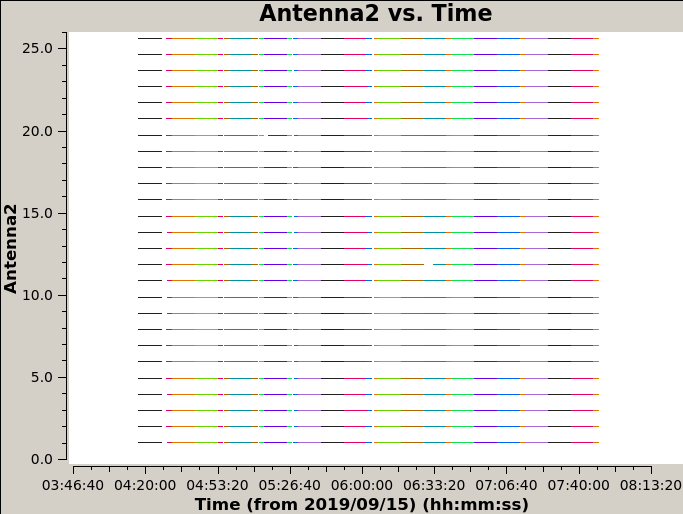

In [7]:
Image(filename=root + "/plots/obsplots/data_stream.png")

## Find Dead Antennas
Antennas that have low power should be flagged. This is also a good time to check for suitable reference antennas.

In [8]:
def plot_dead_ants(ant):
    plotfile = root + f"/plots/dataplots/find_dead_ants_amp_vs_freq_ant_{ant}.png"
    img = mpimg.imread(plotfile)
    plt.imshow(img)
    
interact(plot_dead_ants, ant=(1, 26))
    

interactive(children=(IntSlider(value=13, description='ant', max=26, min=1), Output()), _dom_classes=('widget-…

<function __main__.plot_dead_ants(ant)>

## RFI Inspection
The visibility amplitudes are first averaged across baselines and polarisation products. A modified Z-score is then computed across time as $Z_i = \frac{x_i - \mathrm{med}\{x_i\}_i}{\sigma_\mathrm{MAD}}$, 

where $\sigma_\mathrm{MAD} = \mathrm{med}\{\left|x_i - \mathrm{med}\{x_i\}_i\right|\}$ is the Median Absolute Deviation (MAD), and $x_i$ is the data (visibility amplitude) of the $i^\mathrm{th}$ integration.

The resulting Z-score is a spectrogram with dimensions of time and frequency. It can further be averaged across one of these dimensions to obtain a time series or a spectrum, which are useful for identifying broadband and persistent narrowband RFI respectively.

Use this to identify one clean channel per spectral window which will be used for the initial gain calibration.

#### Load Data

In [9]:

with h5py.File(root + f"/output/z_score_data.h5", "r") as f:
    z_score = f["z-score avg"][()]
    flags = f["flags avg"][()]
    freq_array = f["freq array"][()]
    time_array = f["time array"][()]
    ant_pairs = f["ant pairs"][()]
    dt = f["dt"][()]

# Load time integrations per scan
ntimes_file = os.path.join(root, f"output/ntimes.txt")
ntimes = np.loadtxt(ntimes_file).astype(int)

# time array
tisot = np.unique(Time(time_array, format="jd", scale="utc").isot)

z_score = np.ma.masked_array(z_score, mask=flags)

#### Plot

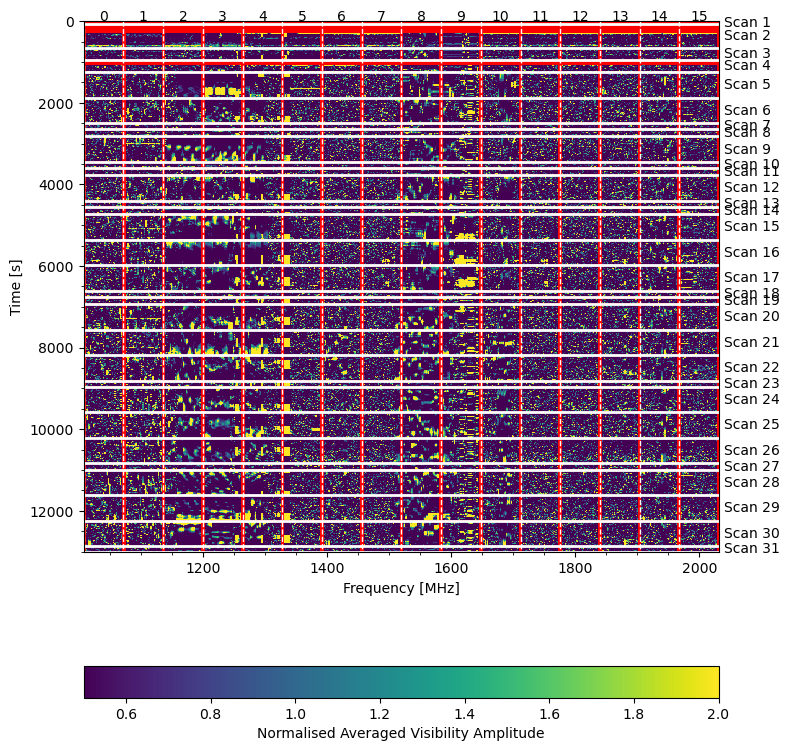

In [10]:
fig, ax = plt.subplots(figsize=(8, 8))
ax, im = inspect.plot_wf(freq_array, z_score, 2, ntimes, vmin=0.5, vmax=2, cmap=cmap, ax=ax, plot_masked=True)
fig.colorbar(im, orientation="horizontal", label="Normalised Averaged Visibility Amplitude")
plt.tight_layout()
plt.show()

In [11]:
def plot_wf_spw(i):
    inspect.plot_wf_spw(freq_array, z_score, i, 2, ntimes, plot_masked=True)
    
interact(plot_wf_spw, i=(0, 15))

interactive(children=(IntSlider(value=7, description='i', max=15), Output()), _dom_classes=('widget-interact',…

<function __main__.plot_wf_spw(i)>

In [12]:
summary_before = np.load(root + "/output/manual_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + "/output/manual_flags_summary_after.npy", allow_pickle='TRUE').item()
        
print("Flag occupancy (percent) before and after manual flags:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after manual flags:

field 3C48
Before: 71.9119, After: 71.9119

field J2040-2507
Before: 74.7533, After: 74.7533

field J2214-3835
Before: 65.3183, After: 65.3183

field J2246-1206
Before: 69.1719, After: 69.1719

field J2314-3138
Before: 65.7735, After: 65.7735

field J2337-0230
Before: 63.5395, After: 63.5395

field QSO J0001+0000
Before: 56.7108, After: 56.7108

field QSO J0001+0006
Before: 55.5641, After: 55.5641

field QSO J0004-0049
Before: 55.5641, After: 55.5641

field QSO J2032-2114
Before: 56.4241, After: 56.4241

field QSO J2100-1715
Before: 56.5675, After: 56.5675

field QSO J2211-3206
Before: 56.4994, After: 56.4994

field QSO J2240-1839
Before: 56.8442, After: 56.8442

field QSO J2315-0023
Before: 56.0158, After: 56.0158

field QSO J2318-0246
Before: 56.7058, After: 56.7058

field QSO J2318-3029
Before: 55.5641, After: 55.5641

field QSO J2318-3113
Before: 56.1342, After: 56.1342

field QSO J2329-0301
Before: 57.1148, After: 57.1148

f

## Flux Calibrator Model
Print model flux densities and plot model amplitude vs. uv-distance. If the calibrator is not resolved, its amplitude should be constant across different uv-distances. If it is slightly resolved, the amplitude will decrease as a function of uv-distance.

In [13]:
setjy = np.load(root + "/output/setjy.npy", allow_pickle='TRUE').item()

print("model flux densities in Jy\n")

for spw in range(16):
    print("SPW {:2d}: I: {:.2f}, U: {:.2f}, V: {:.2f}, Q: {:.2f}".format(spw, *setjy["0"][str(spw)]["fluxd"]))

model flux densities in Jy

SPW  0: I: 21.02, U: 0.00, V: 0.00, Q: 0.00
SPW  1: I: 20.06, U: 0.00, V: 0.00, Q: 0.00
SPW  2: I: 19.18, U: 0.00, V: 0.00, Q: 0.00
SPW  3: I: 18.38, U: 0.00, V: 0.00, Q: 0.00
SPW  4: I: 17.64, U: 0.00, V: 0.00, Q: 0.00
SPW  5: I: 16.96, U: 0.00, V: 0.00, Q: 0.00
SPW  6: I: 16.33, U: 0.00, V: 0.00, Q: 0.00
SPW  7: I: 15.75, U: 0.00, V: 0.00, Q: 0.00
SPW  8: I: 15.20, U: 0.00, V: 0.00, Q: 0.00
SPW  9: I: 14.70, U: 0.00, V: 0.00, Q: 0.00
SPW 10: I: 14.22, U: 0.00, V: 0.00, Q: 0.00
SPW 11: I: 13.78, U: 0.00, V: 0.00, Q: 0.00
SPW 12: I: 13.36, U: 0.00, V: 0.00, Q: 0.00
SPW 13: I: 12.97, U: 0.00, V: 0.00, Q: 0.00
SPW 14: I: 12.59, U: 0.00, V: 0.00, Q: 0.00
SPW 15: I: 12.24, U: 0.00, V: 0.00, Q: 0.00


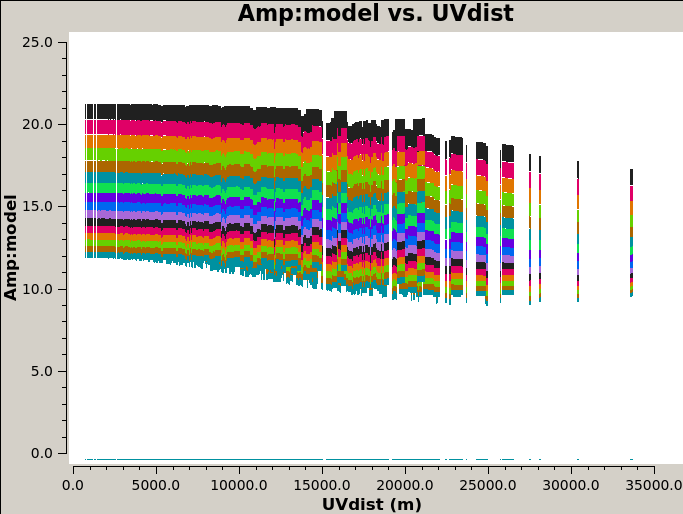

In [14]:
Image(filename=root + "/plots/calplots/setjy_model_amp_vs_uvdist.png")

## Prior Calibration

The prior calibration includes atmospheric opacity corrections, antenna offset corrections and requantizer (rq) gains. These are independent of calibrator observations and use external data instead.

### Weather
Plot weather data and print opacities. For frequencies below 10 GHz the opacity is negligibly small.  

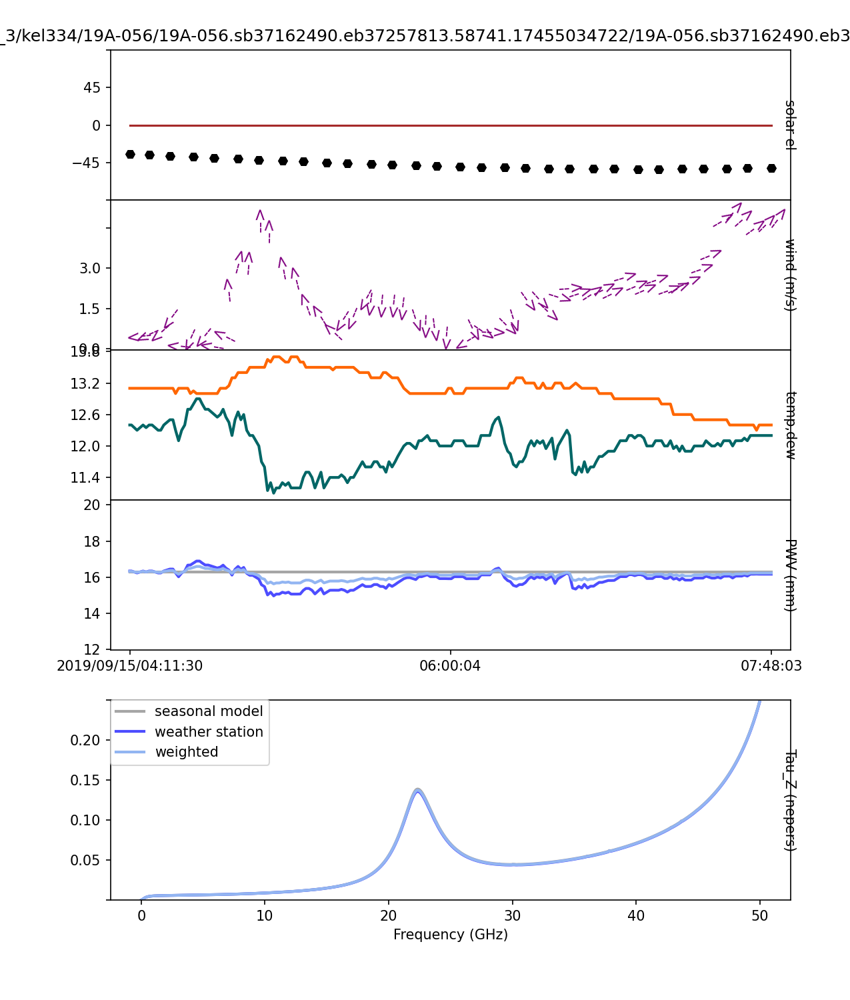

In [15]:
Image(filename=root + "/plots/calplots/weather.png")

In [16]:
opacities = np.load(root + "/output/weather.npy")

print("Opacities [Nepers]\n")

for spw, opacity in enumerate(opacities):
    print(f"SPW {spw}: {opacity}")

Opacities [Nepers]

SPW 0: 0.005155684556099084
SPW 1: 0.005215969923216257
SPW 2: 0.005268488613463317
SPW 3: 0.005314465621468497
SPW 4: 0.005355338013537887
SPW 5: 0.005391703262428326
SPW 6: 0.00542449211457484
SPW 7: 0.005454179268652408
SPW 8: 0.0054812940099999395
SPW 9: 0.005506243106075099
SPW 10: 0.005529317095745963
SPW 11: 0.005550862556259642
SPW 12: 0.005571028693795845
SPW 13: 0.005590094436518318
SPW 14: 0.005608170944099021
SPW 15: 0.00562543645324405


## Plot Calibration Channels
These are the channels that have been selected for the gain calibration. They should be clean and should not exhibit any amplitude jumps.

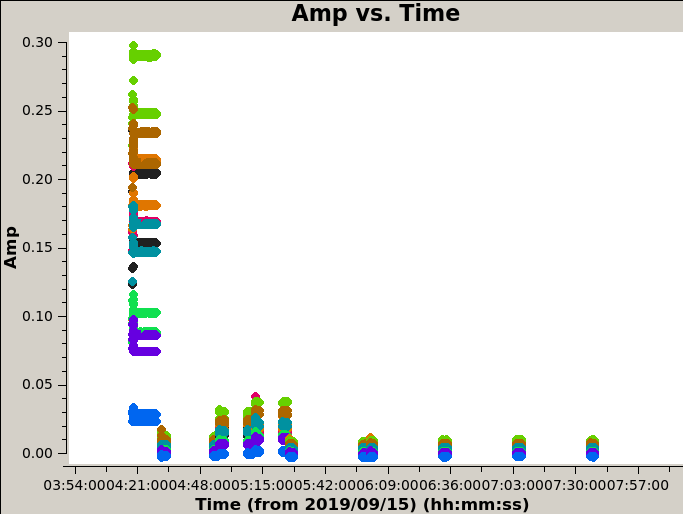

In [17]:
Image(filename=root + "/plots/dataplots/single_chans_amp_vs_time.png")

## Initial Calibration
The initial calibration is done to enable subsequent flagging with automated flagging routines such as CASA's RFlag. The calibration consists of an initial gain phase calibration, a delay calibration, an initial gain phase and amplitude calibration and a bandpass calibration. The two gain calibrations are used for the delay and bandpass calibrations, but are not applied to the data. The gain calibrations are done with a single channel per spectral window.

In [18]:
def plot_two_cols(im1, im2):
    """ 
    Plot two image side by side. E.g phase and amplitude.
    """
    fix, ax = plt.subplots(1, 2, figsize=(15, 5))

    if os.path.exists(im1):
        img_1 = mpimg.imread(im1)
        ax[0].imshow(img_1)

    if os.path.exists(im2):
        img_2 = mpimg.imread(im2)
        ax[1].imshow(img_2)

### Specify Gain Tables

In [19]:
# specify calibration table names
rnd = 0
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table_0 = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

### Delay Initial Gain Calibration
This is an initial per-integration phase calibration and is done to avoid decorrelation under temporal averaging in the subsequent delay calibration. The gain phase should be stable in time. Antennas or spectral windows that have gain phase discontinuities should be flagged. If all but the reference antenna exhibit phase jumps, a difference reference antenna should be chosen.

In [20]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration
The delay calibration is done by fitting for the phase slopes across frequency with respect to the reference antenna. The first and last 15 channels of the spectral windows are not used in this step, since they have lower gains. The delays should lie between -5 and 5 ns, and anything outside that range should be treated with suspicion.

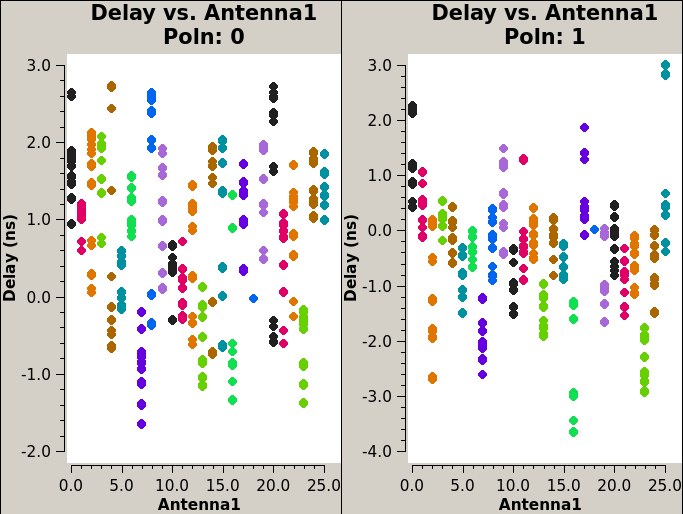

In [21]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration
Similarly to above, we perform an initial gain calibration for the bandpass calibration, but this time we also solve for the amplitudes. The phases and amplitudes should be constant with time and discontinuous solutions should be flagged.

In [22]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table_0}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table_0}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration
The amplitudes and phases of the bandpass calibration should be close to 1 and zero respectively after the initial gain calibration. Discontinuities should be flagged.

In [23]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [24]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Plot Corrected Data
This data is averaged in time and colorised by antenna.

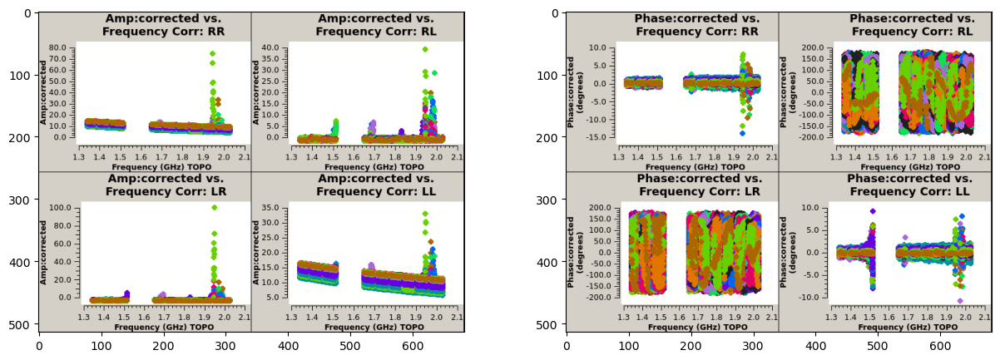

In [25]:
plot_two_cols(
    root + f"/plots/dataplots/fluxcal_initcal_round_0_amp_vs_freq_CorrRR,RL,LR,LL.png",
    root + f"/plots/dataplots/fluxcal_initcal_round_0_phase_vs_freq_CorrRR,RL,LR,LL.png"
)

#### Plot Averaged Corrected Data
Iterate through spectral windows to identify RFI and flag bad channels manually below.

In [26]:
def plot_corrected_spw(spw):
    img = mpimg.imread(root + f"/plots/dataplots/fluxcal_initcal_round_0_amp_vs_freq_avg_spw_{spw}_CorrRR,RL,LR,LL.png")
    plt.imshow(img)

interact(plot_corrected_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_corrected_spw(spw)>

### Flagging Summary
If no calibration solutions are available, data may be flagged (e.g. bad spectral windows).

In [27]:
rnd=0
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after initial calibration round {rnd}:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after initial calibration round 0:

field 3C48
Before: 46.0708, After: 71.9119

antenna ea01
Before: 45.2327, After: 70.6375

antenna ea02
Before: 45.2542, After: 70.6375

antenna ea03
Before: 45.2464, After: 70.6375

antenna ea04
Before: 45.2567, After: 70.6375

antenna ea05
Before: 45.2327, After: 70.6375

antenna ea06
Before: 45.2542, After: 70.6375

antenna ea07
Before: 45.2464, After: 70.6375

antenna ea08
Before: 45.2567, After: 70.6375

antenna ea09
Before: 45.2327, After: 70.6375

antenna ea10
Before: 45.2542, After: 70.6375

antenna ea11
Before: 45.2464, After: 70.6375

antenna ea12
Before: 45.2567, After: 70.6375

antenna ea13
Before: 45.2327, After: 70.6375

antenna ea14
Before: 45.2542, After: 70.6375

antenna ea15
Before: 45.2464, After: 70.6375

antenna ea16
Before: 48.5350, After: 73.9157

antenna ea17
Before: 45.2327, After: 70.6375

antenna ea18
Before: 45.5249, After: 70.9082

antenna ea19
Before: 45.2464, After: 70.6375

antenna ea

## First Round of Flagging on Primary Calibrator
The first round of flagging is performed on the primary calibrator only. The flagging routine runs RFlag with timedevscale=5.0, freqdevscale=5.0 and freqfit=line on a ABS_RL, ABS_LR, ABS_LL, ABS_RR, REAL_LL, REAL_RR, IMAG_LL and IMAG_RR, where for the real and imaginary parts RFLag is performed on the residual (corrected-model) data. TFCrop is run with timecutoff=4.0 and freqcutoff=4.0 on ABS_RL, ABS_LR, ABS_LL and ABS_RR. Flags are extended across polarisations. The plots below show the amplitudes and phases of the calibrators before and after flagging respectively.

### Before Flagging

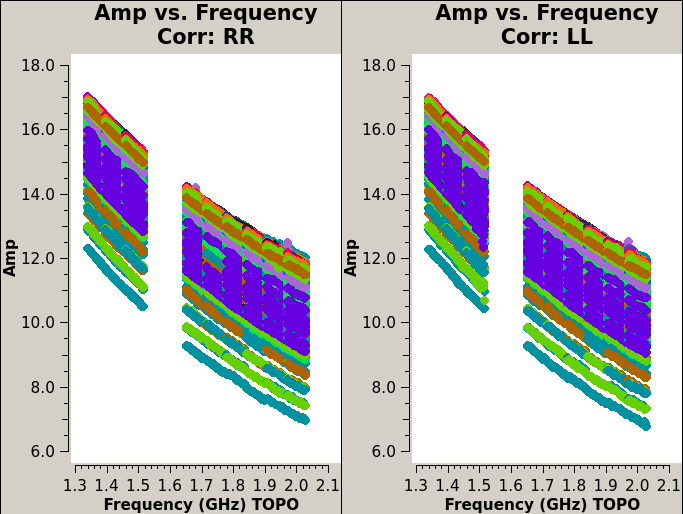

In [28]:
Image(filename=root + "/plots/dataplots/before_fluxcal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

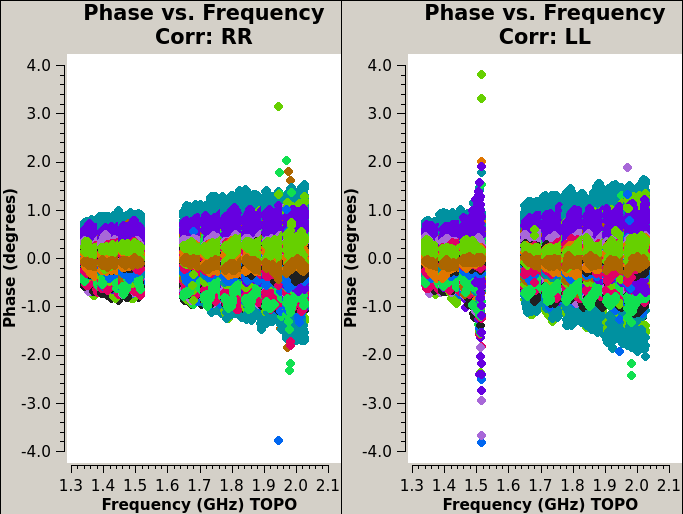

In [29]:
Image(filename=root + "/plots/dataplots/before_fluxcal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### After Flagging

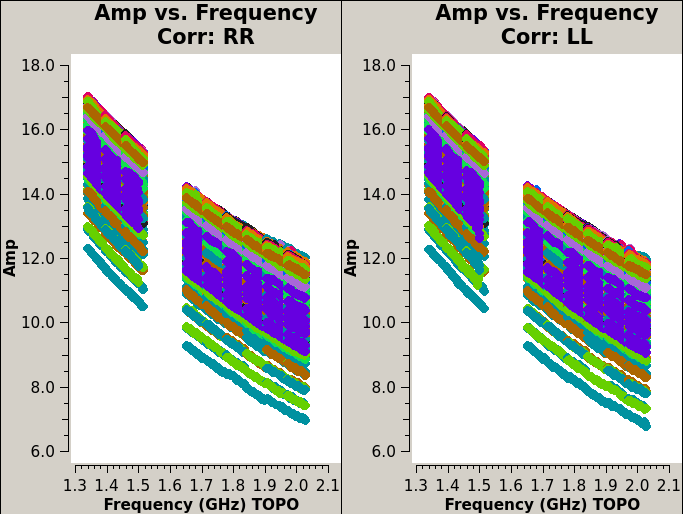

In [30]:
Image(filename=root + "/plots/dataplots/after_fluxcal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

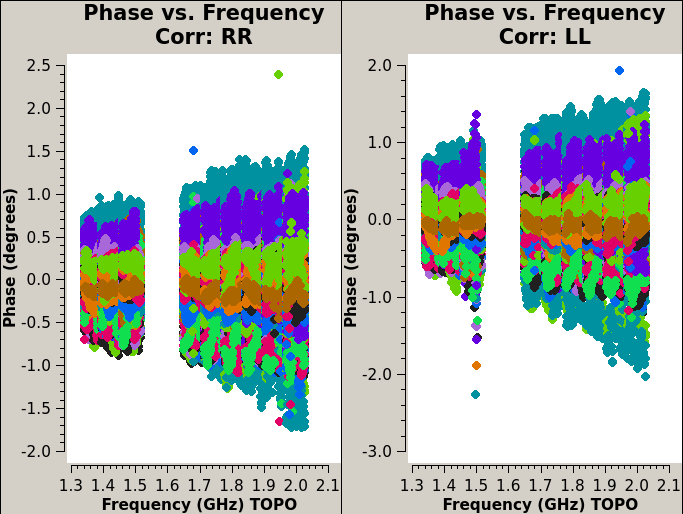

In [31]:
Image(filename=root + "/plots/dataplots/after_fluxcal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### Summary

In [32]:
summary_before = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the flux calibrator:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the flux calibrator:

field 3C48
Before: 71.9119, After: 72.1288

antenna ea01
Before: 70.6375, After: 70.7137

antenna ea02
Before: 70.6375, After: 70.6915

antenna ea03
Before: 70.6375, After: 70.7024

antenna ea04
Before: 70.6375, After: 70.6983

antenna ea05
Before: 70.6375, After: 70.8812

antenna ea06
Before: 70.6375, After: 70.7177

antenna ea07
Before: 70.6375, After: 71.0735

antenna ea08
Before: 70.6375, After: 70.7703

antenna ea09
Before: 70.6375, After: 70.9880

antenna ea10
Before: 70.6375, After: 70.9972

antenna ea11
Before: 70.6375, After: 70.7003

antenna ea12
Before: 70.6375, After: 71.0578

antenna ea13
Before: 70.6375, After: 70.7110

antenna ea14
Before: 70.6375, After: 70.7756

antenna ea15
Before: 70.6375, After: 70.6880

antenna ea16
Before: 73.9157, After: 74.1074

antenna ea17
Before: 70.6375, After: 70.7452

antenna ea18
Before: 70.9082, After: 72.3338

antenna ea19
Before: 70.6375, After: 70.8841

antenna e

## Semi-Final Calibration
The steps from the intitial calibration are repeated. 

### Specify Gain Tables

In [33]:
# specify calibration table names
rnd = 1
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table_1 = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

### Delay Initial Gain Calibration

In [34]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration

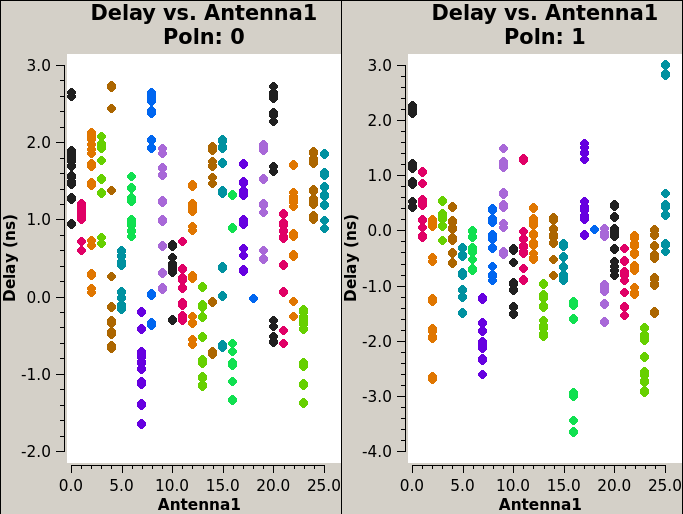

In [35]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration

In [36]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table_1}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table_1}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration

In [37]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [38]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Flagging Summary
If no calibration solutions are available, data may be flagged (e.g. bad spectral windows).

In [39]:
rnd=1
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after initial calibration round {rnd}:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after initial calibration round 1:

field 3C48
Before: 72.1288, After: 72.1288

antenna ea01
Before: 70.7137, After: 70.7137

antenna ea02
Before: 70.6915, After: 70.6915

antenna ea03
Before: 70.7024, After: 70.7024

antenna ea04
Before: 70.6983, After: 70.6983

antenna ea05
Before: 70.8812, After: 70.8812

antenna ea06
Before: 70.7177, After: 70.7177

antenna ea07
Before: 71.0735, After: 71.0735

antenna ea08
Before: 70.7703, After: 70.7703

antenna ea09
Before: 70.9880, After: 70.9880

antenna ea10
Before: 70.9972, After: 70.9972

antenna ea11
Before: 70.7003, After: 70.7003

antenna ea12
Before: 71.0578, After: 71.0578

antenna ea13
Before: 70.7110, After: 70.7110

antenna ea14
Before: 70.7756, After: 70.7756

antenna ea15
Before: 70.6880, After: 70.6883

antenna ea16
Before: 74.1074, After: 74.1074

antenna ea17
Before: 70.7452, After: 70.7455

antenna ea18
Before: 72.3338, After: 72.3344

antenna ea19
Before: 70.8841, After: 70.8841

antenna ea

## Second Round of Flagging
The flagging is repeated, but this time on all calibrators.

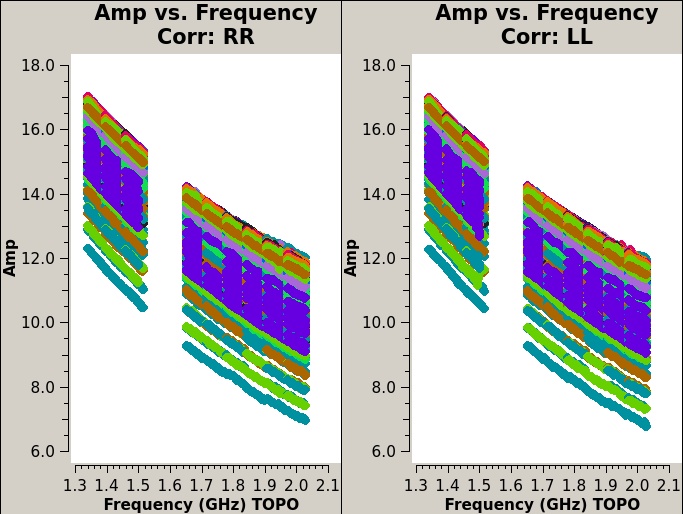

In [40]:
# primary calibrator
Image(filename=root + "/plots/dataplots/before_fluxcal_round_1_flagging_amp_vs_freq_CorrRR,LL.png")

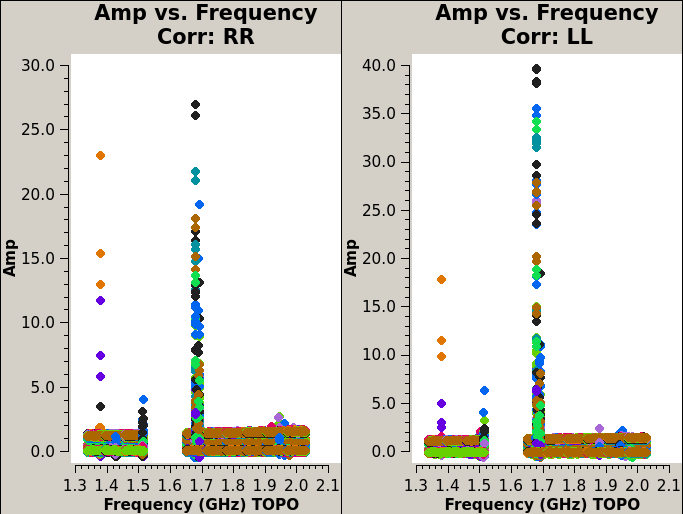

In [41]:
# phase calibrators
Image(filename=root + "/plots/dataplots/before_phasecal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

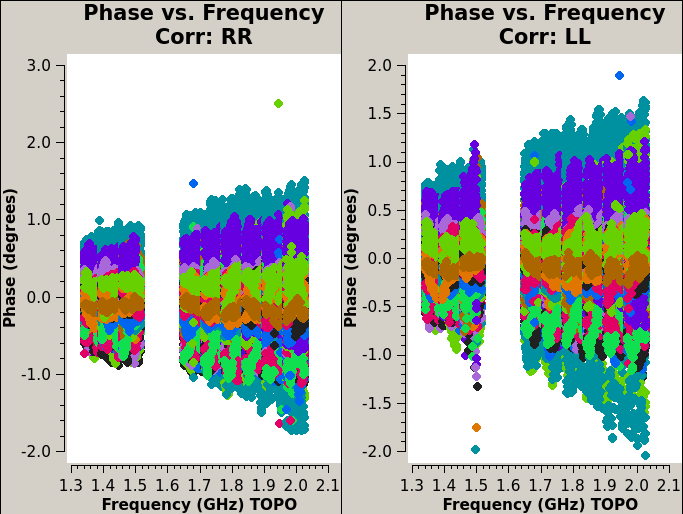

In [42]:
# primary calibrator
Image(filename=root + "/plots/dataplots/before_fluxcal_round_1_flagging_phase_vs_freq_CorrRR,LL.png")

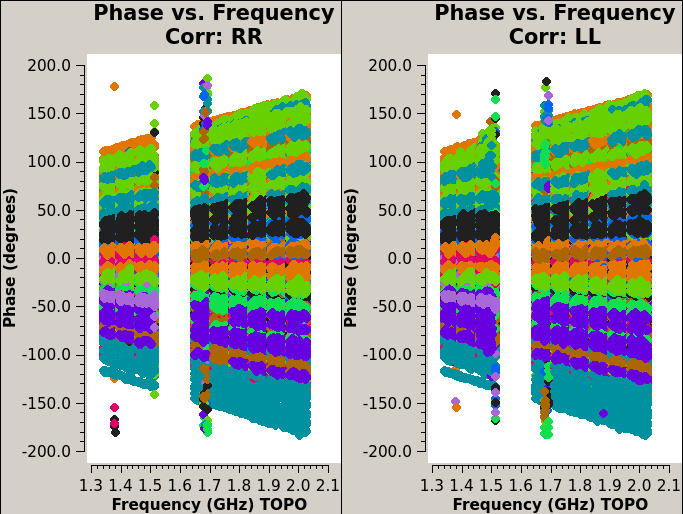

In [43]:
# phase calibrators
Image(filename=root + "/plots/dataplots/before_phasecal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### After Flagging

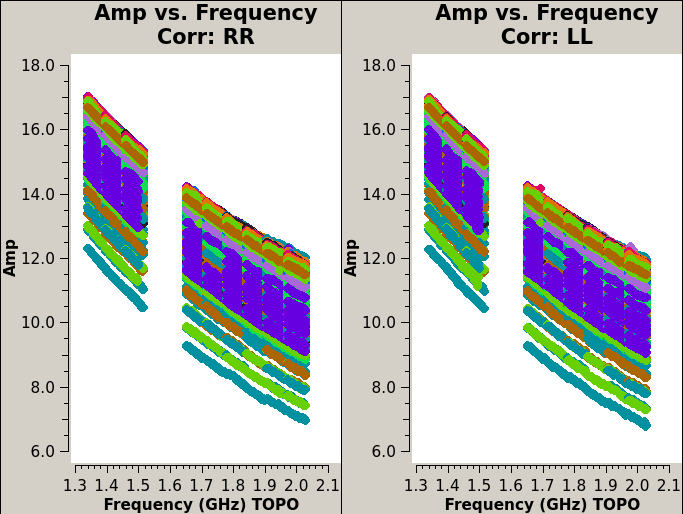

In [44]:
# primary calibrator
Image(filename=root + "/plots/dataplots/after_fluxcal_round_1_flagging_amp_vs_freq_CorrRR,LL.png")

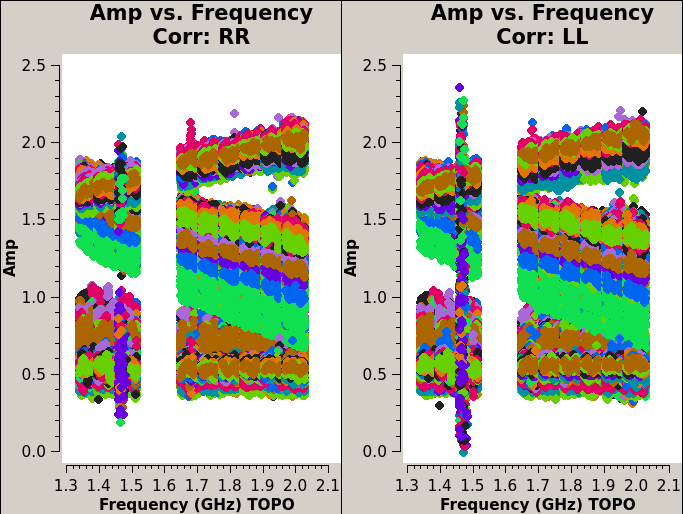

In [45]:
# phase calibrators
Image(filename=root + "/plots/dataplots/after_phasecal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

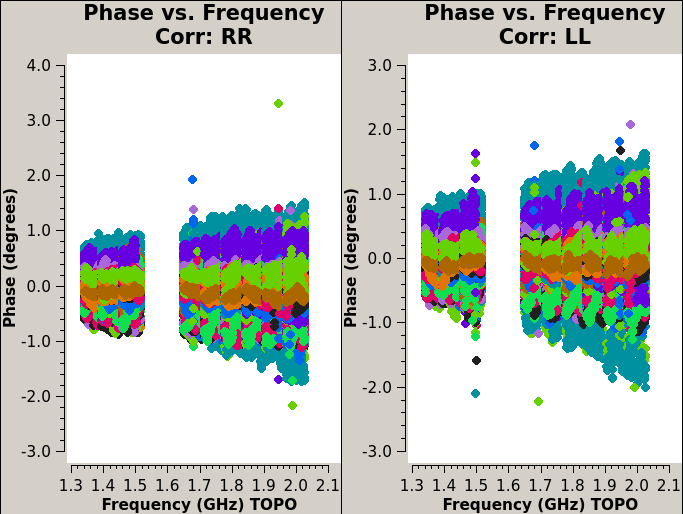

In [46]:
# primary calibrator
Image(filename=root + "/plots/dataplots/after_fluxcal_round_1_flagging_phase_vs_freq_CorrRR,LL.png")

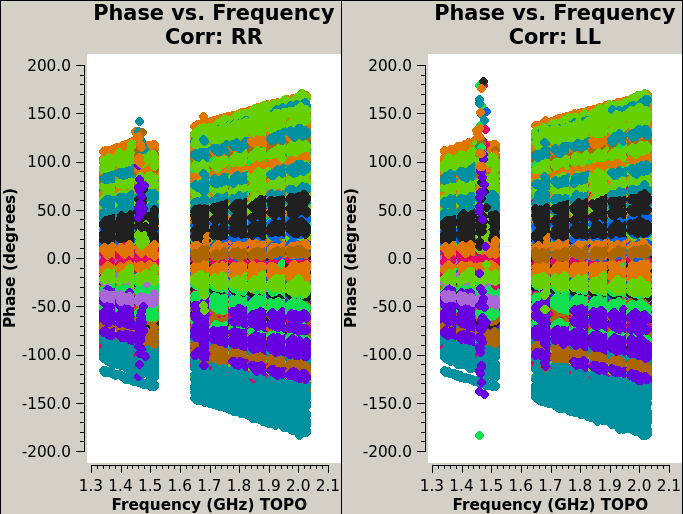

In [47]:
# phase calibrators
Image(filename=root + "/plots/dataplots/after_phasecal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### Flagging Summary

In [48]:
summary_before = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the flux calibrator:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the flux calibrator:

field 3C48
Before: 72.1288, After: 72.2233

scan 1
Before: 100.0000, After: 100.0000

scan 2
Before: 76.4030, After: 76.4882

scan 3
Before: 58.1559, After: 58.2871

antenna ea01
Before: 70.7137, After: 70.7822

antenna ea02
Before: 70.6915, After: 70.7372

antenna ea03
Before: 70.7024, After: 70.7577

antenna ea04
Before: 70.6983, After: 70.7583

antenna ea05
Before: 70.8812, After: 70.9971

antenna ea06
Before: 70.7177, After: 70.8217

antenna ea07
Before: 71.0735, After: 71.2284

antenna ea08
Before: 70.7703, After: 70.8505

antenna ea09
Before: 70.9880, After: 71.1103

antenna ea10
Before: 70.9972, After: 71.1486

antenna ea11
Before: 70.7003, After: 70.7551

antenna ea12
Before: 71.0578, After: 71.2720

antenna ea13
Before: 70.7110, After: 70.7799

antenna ea14
Before: 70.7756, After: 70.8461

antenna ea15
Before: 70.6883, After: 70.7406

antenna ea16
Before: 74.1074, After: 74.2104

antenna ea17
Before: 70.7

In [49]:
summary_before = np.load(root + f"/output/phasecal_round_0_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/phasecal_round_0_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the phase calibrators:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the phase calibrators:

field J2040-2507
Before: 74.8042, After: 75.4019

field J2214-3835
Before: 65.3882, After: 66.0935

field J2246-1206
Before: 69.2340, After: 69.9084

field J2314-3138
Before: 65.8422, After: 66.4702

field J2337-0230
Before: 63.6130, After: 64.8096

scan 10
Before: 63.6955, After: 64.3899

scan 11
Before: 73.8390, After: 74.4388

scan 13
Before: 63.6955, After: 64.4597

scan 14
Before: 70.9977, After: 71.5800

scan 18
Before: 59.7113, After: 60.3937

scan 19
Before: 75.5770, After: 76.1590

scan 23
Before: 57.0397, After: 58.4364

scan 27
Before: 60.1568, After: 61.4637

scan 31
Before: 59.4150, After: 61.0322

scan 4
Before: 80.3585, After: 80.9390

scan 7
Before: 63.6955, After: 64.3278

scan 8
Before: 66.7957, After: 67.5100

antenna ea01
Before: 66.1089, After: 66.7224

antenna ea02
Before: 66.1290, After: 66.6069

antenna ea03
Before: 66.1089, After: 66.5903

antenna ea04
Before: 66.1438, After: 67.0990

an

## Final Calibration
First, the initial calibration (delay and bandpass) are repeated on the primary calibrator. Then, the final gains of the calibrators are derived.

### Specify Gain Tables

In [50]:
# specify calibration table names
rnd = 2
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

fluxcal_phase_table = f"{name}_fluxcal_phase.Gfinal"
short_gain_table = f"{name}_short.Gfinal"
amp_gain_table = f"{name}.fluxscale"
phase_gain_table = f"{name}_phase.Gfinal"

### Delay Initial Gain Calibration

In [51]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration

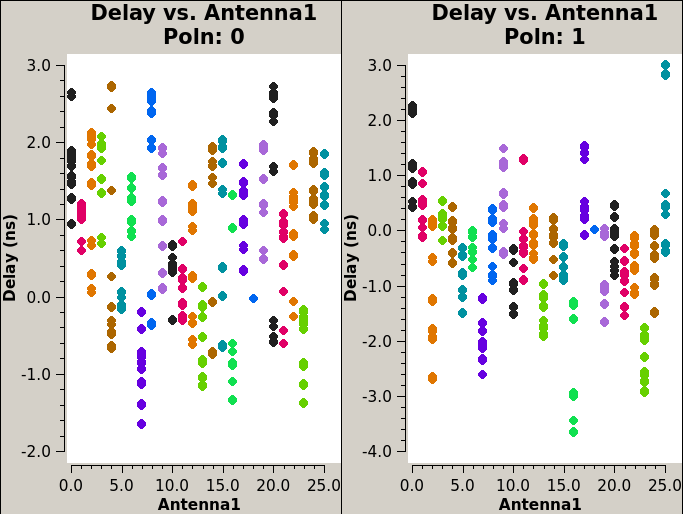

In [52]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration

In [53]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration

In [54]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [55]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Flux Calibrator Final Gain Phase

In [56]:
def plot_final_fluxcal_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{fluxcal_phase_table}_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_fluxcal_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_fluxcal_phase(ant)>

### Short Interval Gain Calibration
This is an initial calibration done on a per-integration basis on the calibrators.

In [57]:
def plot_final_short_gain_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{short_gain_table}_phase_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_short_gain_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_short_gain_phase(ant)>

### Long Interval Gain Calibration
The gain amplitudes of the calibrators of solved for using the initial gain phase calibration above.

In [58]:
def plot_final_long_gain(ant):
    plot_two_cols(
        root + f'/plots/calplots/{amp_gain_table}_amp_ant_{ant}_Poln0,1.png',
        root + f'/plots/calplots/{amp_gain_table}_phase_ant_{ant}_Poln0,1.png'
    )
interact(plot_final_long_gain, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_long_gain(ant)>

### Phase Calibration
Derive the final gain phases of the calibrators. That of the primary calibrator should be close to zero, since it was already derived and applied earlier on.

In [59]:
def plot_final_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{phase_gain_table}_phase_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_phase(ant)>

### Flagging Summary

In [60]:
rnd=1
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after final delay and bandpass calibration:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after final delay and bandpass calibration:

field 3C48
Before: 72.1288, After: 72.1288

antenna ea01
Before: 70.7137, After: 70.7137

antenna ea02
Before: 70.6915, After: 70.6915

antenna ea03
Before: 70.7024, After: 70.7024

antenna ea04
Before: 70.6983, After: 70.6983

antenna ea05
Before: 70.8812, After: 70.8812

antenna ea06
Before: 70.7177, After: 70.7177

antenna ea07
Before: 71.0735, After: 71.0735

antenna ea08
Before: 70.7703, After: 70.7703

antenna ea09
Before: 70.9880, After: 70.9880

antenna ea10
Before: 70.9972, After: 70.9972

antenna ea11
Before: 70.7003, After: 70.7003

antenna ea12
Before: 71.0578, After: 71.0578

antenna ea13
Before: 70.7110, After: 70.7110

antenna ea14
Before: 70.7756, After: 70.7756

antenna ea15
Before: 70.6880, After: 70.6883

antenna ea16
Before: 74.1074, After: 74.1074

antenna ea17
Before: 70.7452, After: 70.7455

antenna ea18
Before: 72.3338, After: 72.3344

antenna ea19
Before: 70.8841, After: 70.8841

a

In [61]:
summary_before = np.load(root + f"/output/applycal_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/applycal_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after applying final calibration:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after applying final calibration:

field 3C48
Before: 72.2233, After: 72.2611

field J2040-2507
Before: 75.4019, After: 75.4026

field J2214-3835
Before: 66.0935, After: 66.0937

field J2246-1206
Before: 69.9084, After: 69.9087

field J2314-3138
Before: 66.4702, After: 66.4704

field J2337-0230
Before: 64.8096, After: 64.8112

field QSO J0001+0000
Before: 56.8115, After: 57.1001

field QSO J0001+0006
Before: 55.6674, After: 55.9636

field QSO J0004-0049
Before: 55.6674, After: 55.9636

field QSO J2032-2114
Before: 56.5255, After: 56.8159

field QSO J2100-1715
Before: 56.6685, After: 56.9580

field QSO J2211-3206
Before: 56.6007, After: 56.8908

field QSO J2240-1839
Before: 56.9452, After: 57.2347

field QSO J2315-0023
Before: 56.1181, After: 56.4114

field QSO J2318-0246
Before: 56.8065, After: 57.0951

field QSO J2318-3029
Before: 55.6674, After: 55.9636

field QSO J2318-3113
Before: 56.2363, After: 56.5287

field QSO J2329-0301
Before: 57.2161, Aft

## Target Flags
Now that the final calibration tables have been derived and applied to the data, the automated flagging routine is run on the target fields.

### Before Flagging

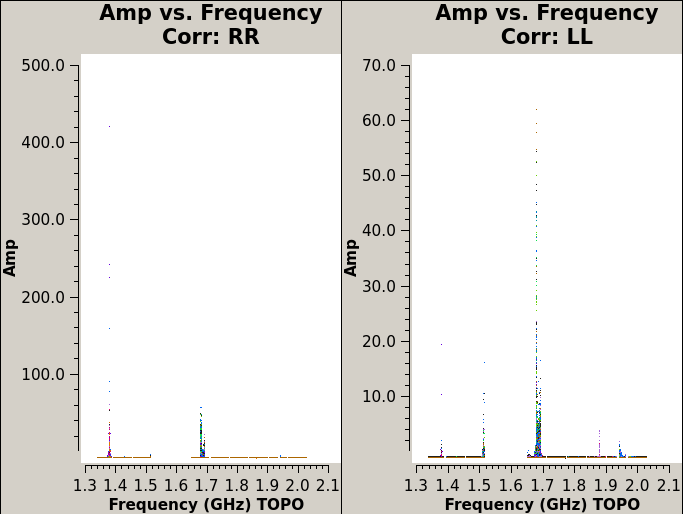

In [62]:
Image(filename=root + "/plots/dataplots/before_targets_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

### After Flagging

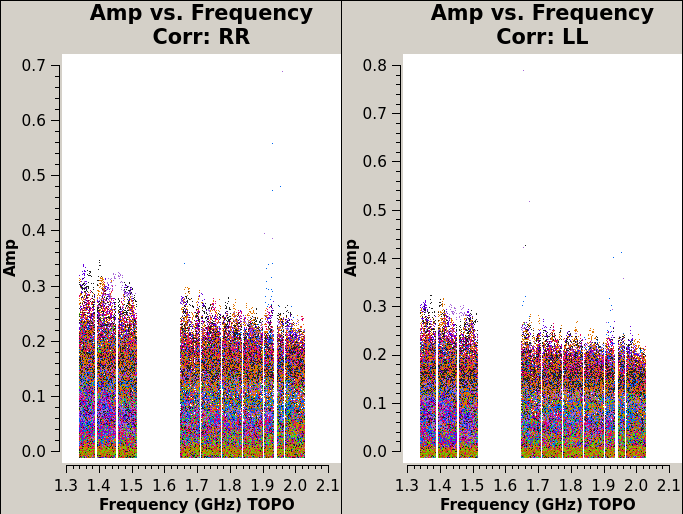

In [63]:
Image(filename=root + "/plots/dataplots/after_targets_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

### Summary

In [64]:
rnd=0
summary_before = np.load(root + f"/output/targets_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/targets_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) after flagging the flux calibrator:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) after flagging the flux calibrator:

field QSO J0001+0000
Before: 57.1001, After: 58.2955

field QSO J0001+0006
Before: 55.9636, After: 56.9731

field QSO J0004-0049
Before: 55.9636, After: 57.2714

field QSO J2032-2114
Before: 56.8159, After: 57.8997

field QSO J2100-1715
Before: 56.9580, After: 57.6540

field QSO J2211-3206
Before: 56.8908, After: 57.5298

field QSO J2240-1839
Before: 57.2347, After: 58.1008

field QSO J2315-0023
Before: 56.4114, After: 57.4728

field QSO J2318-0246
Before: 57.0951, After: 58.4582

field QSO J2318-3029
Before: 55.9636, After: 56.6155

field QSO J2318-3113
Before: 56.5287, After: 57.1529

field QSO J2329-0301
Before: 57.5065, After: 58.8366

field QSO J2348-3054
Before: 56.5318, After: 57.2004

field QSO J2356+0017
Before: 57.1001, After: 58.1561

field QSO J2356+0023
Before: 55.9636, After: 57.0335

field QSO J2356-0622
Before: 57.2421, After: 58.3133

scan 12
Before: 57.2347, After: 58.1008

scan 15
Before: 55.9636, After: 5

## Summary Plots
These plots show the corrected amplitudes and phases of all fields as a function of uv-distance and frequency. The values plotted against uv-distance are colorised by spectral window while those plotted against frequency are colorised by antenna number. Remaining RFI should be flagged manually in CASA.

In [65]:
field_dict = vladata.get_field_names(ms)
fields = field_dict["calibrators"] + "," + field_dict["targets"]

3C48


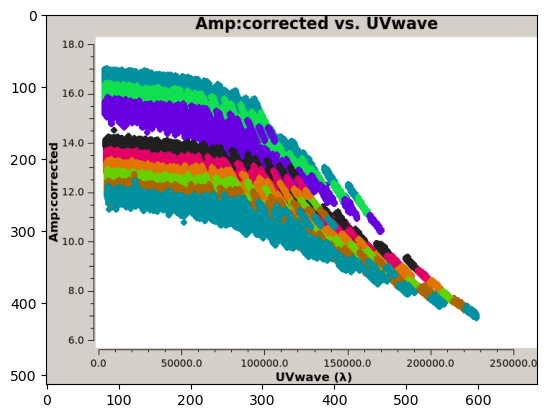

J2040-2507


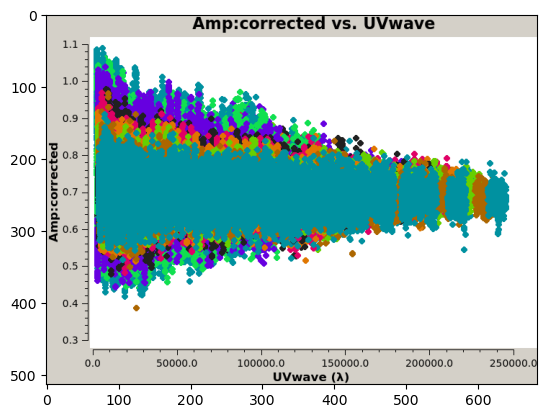

J2214-3835


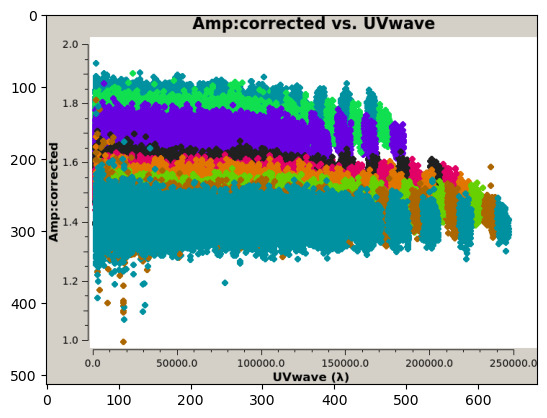

J2246-1206


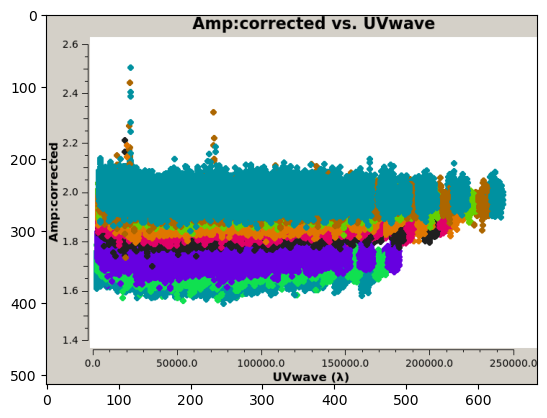

J2314-3138


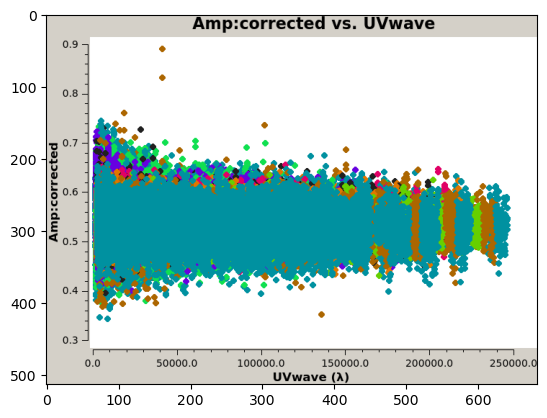

J2337-0230


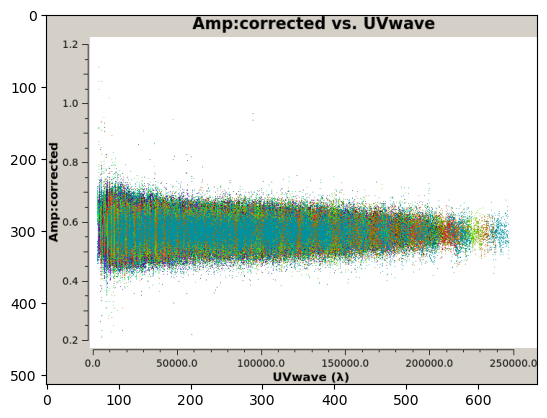

QSO J2032-2114


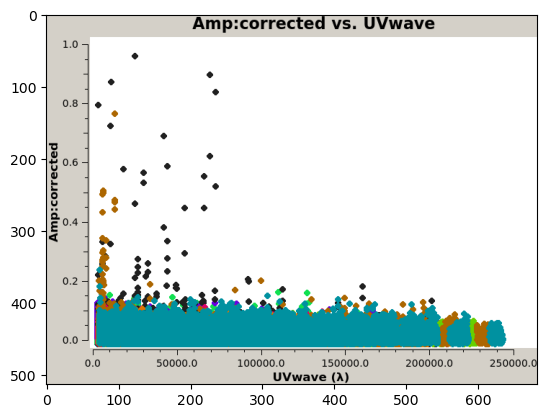

QSO J2100-1715


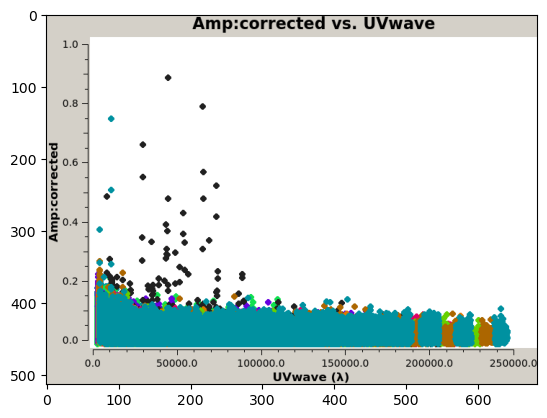

QSO J2211-3206


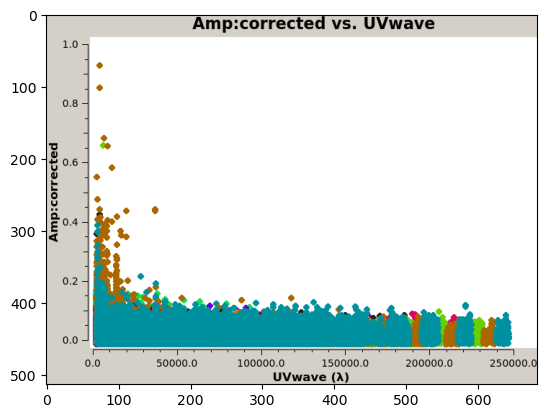

QSO J2240-1839


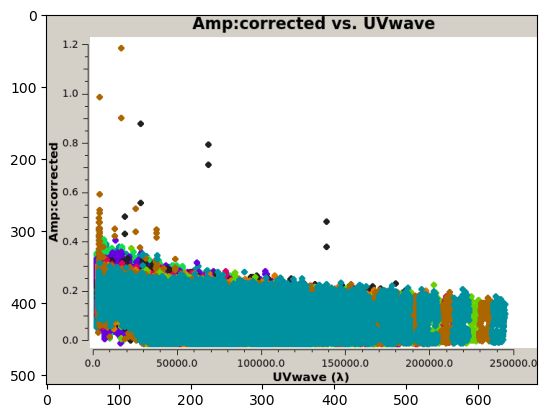

QSO J2318-3029


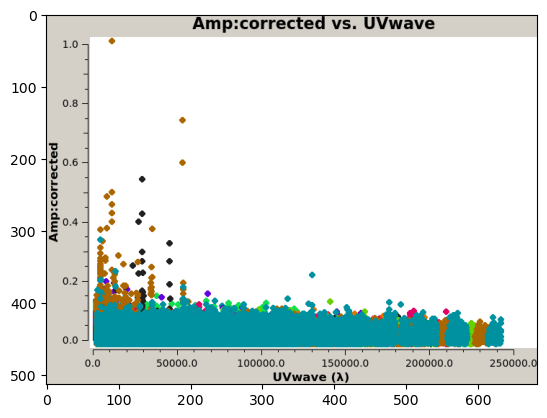

QSO J2318-3113


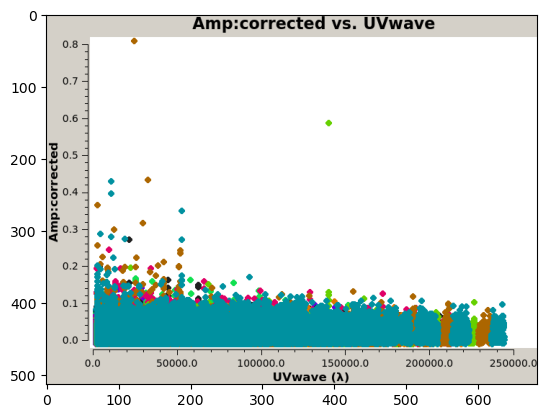

QSO J2348-3054


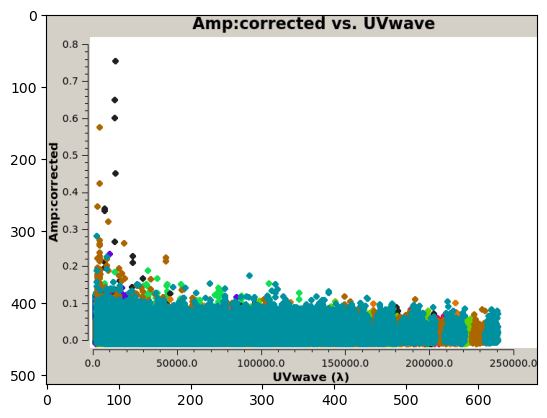

QSO J2315-0023


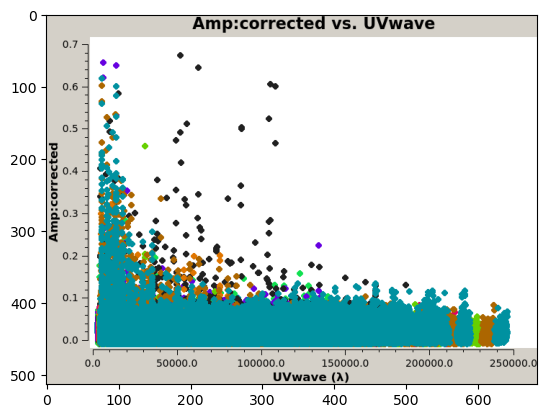

QSO J2318-0246


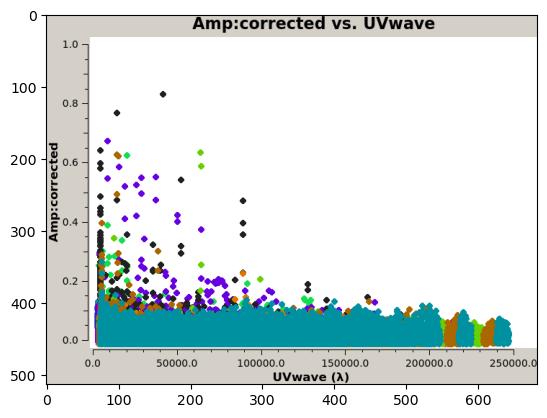

QSO J2329-0301


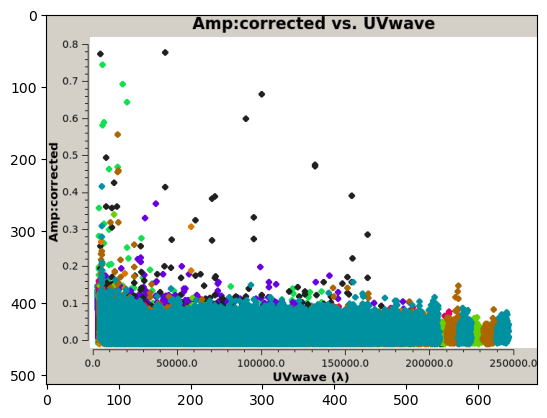

QSO J2356+0017


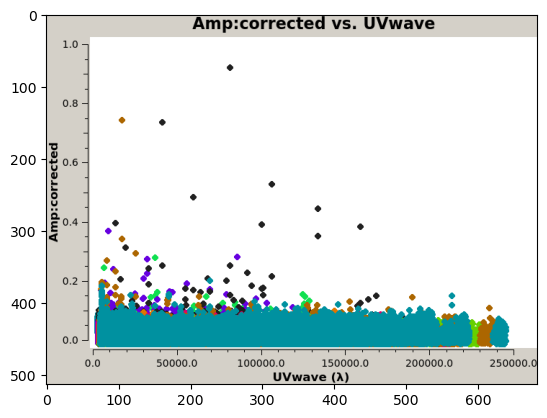

QSO J2356+0023


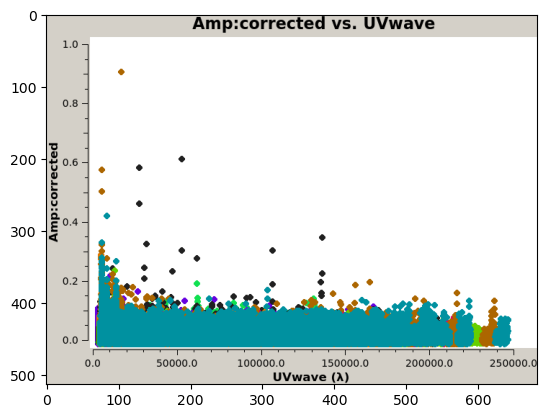

QSO J0001+0006


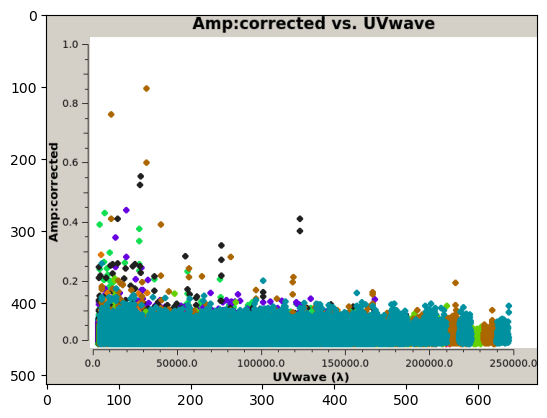

QSO J0001+0000


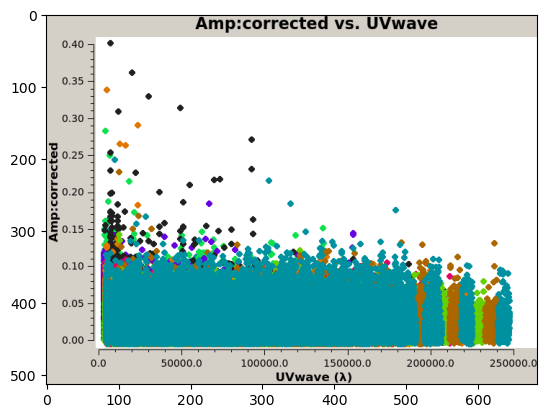

QSO J0004-0049


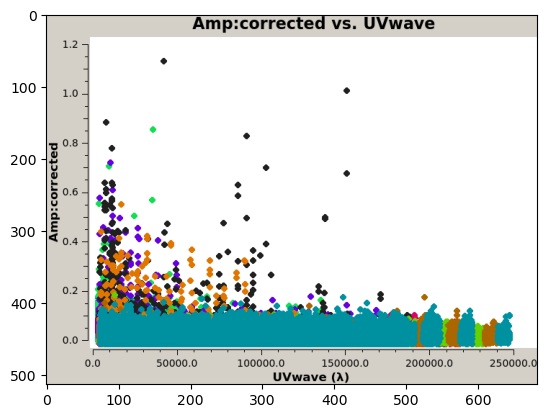

QSO J2356-0622


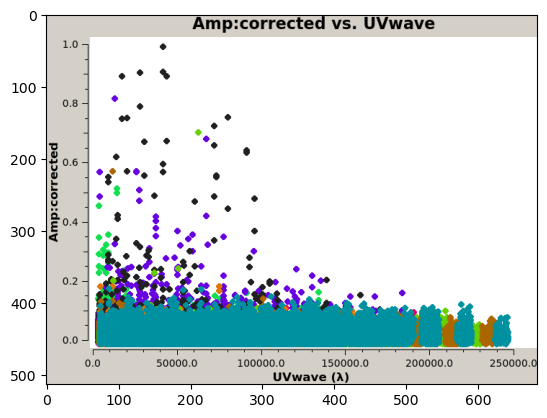

In [66]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_amp_vs_uvdist_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

3C48


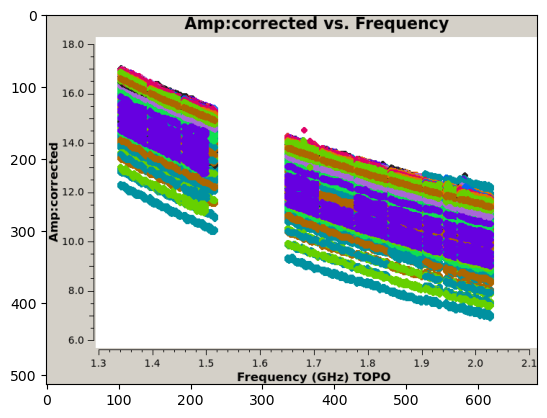

J2040-2507


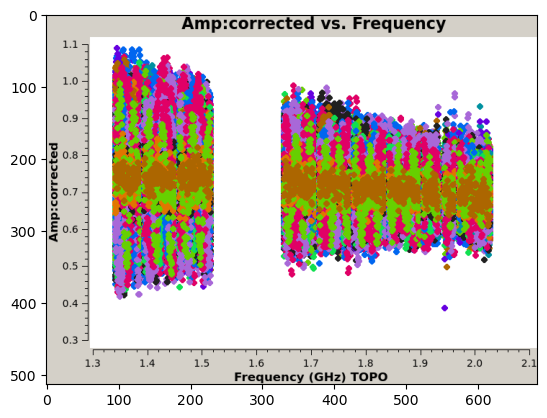

J2214-3835


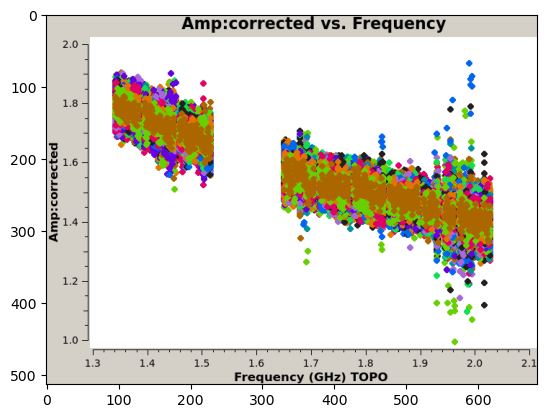

J2246-1206


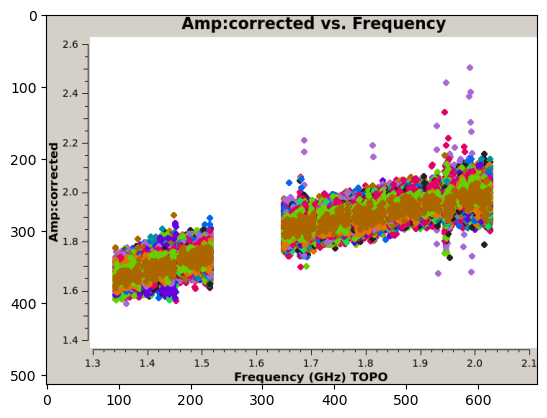

J2314-3138


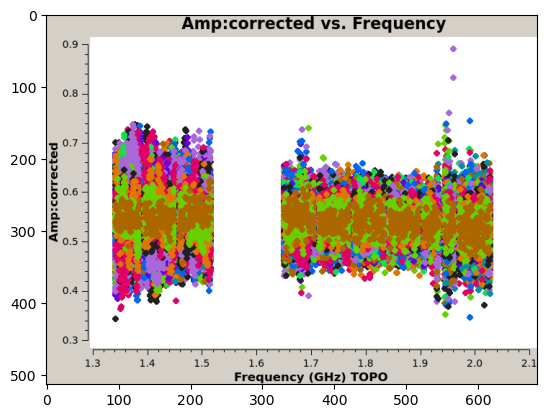

J2337-0230


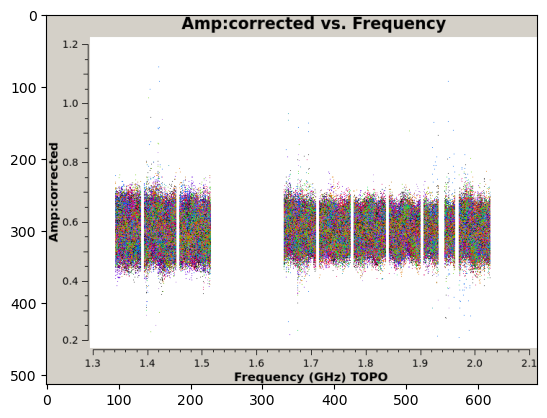

QSO J2032-2114


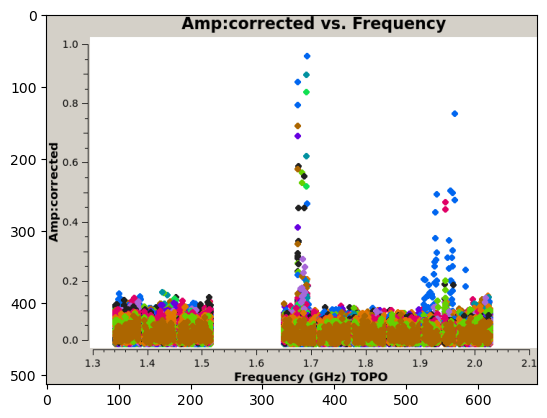

QSO J2100-1715


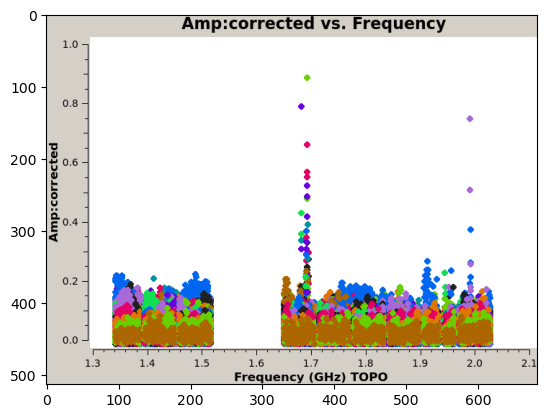

QSO J2211-3206


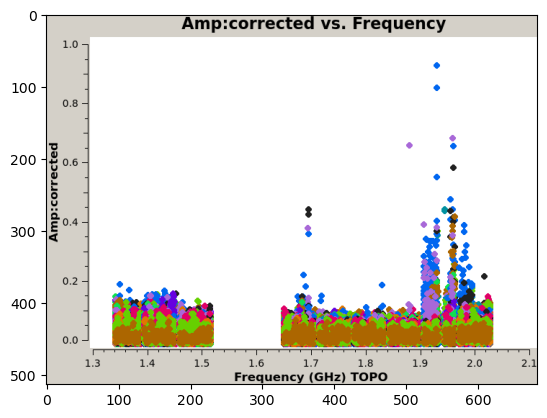

QSO J2240-1839


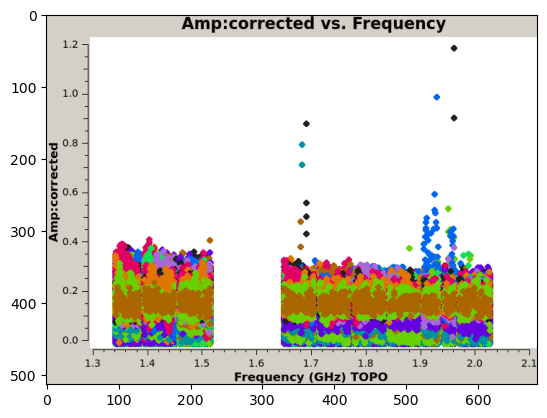

QSO J2318-3029


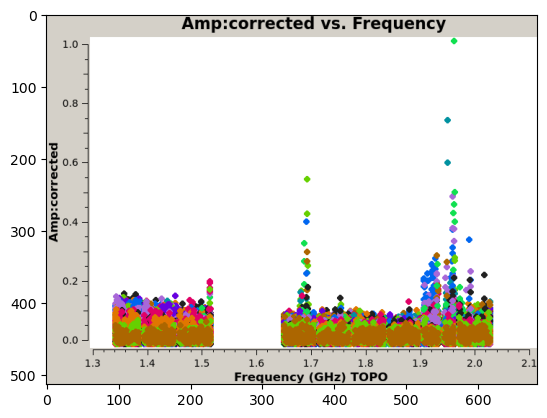

QSO J2318-3113


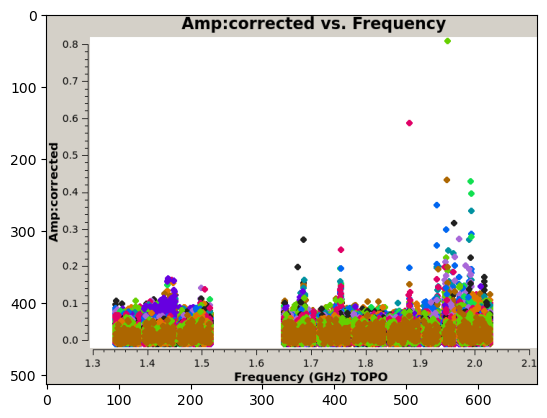

QSO J2348-3054


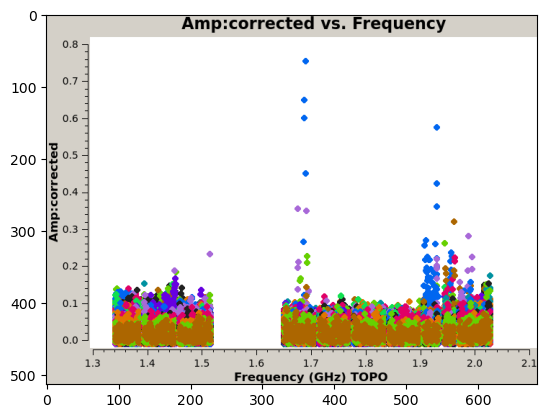

QSO J2315-0023


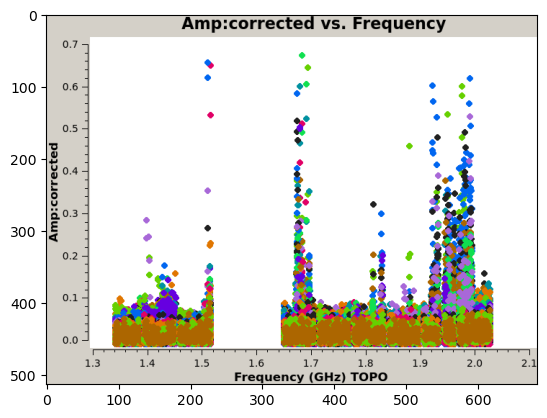

QSO J2318-0246


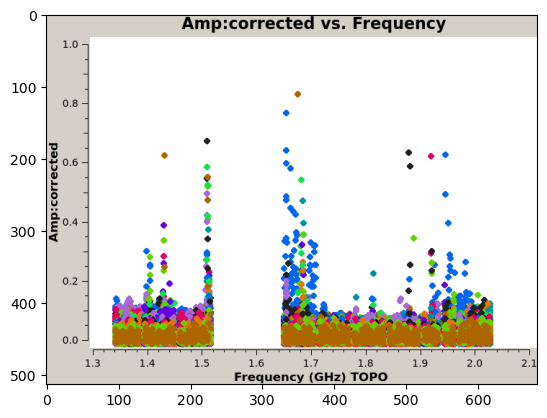

QSO J2329-0301


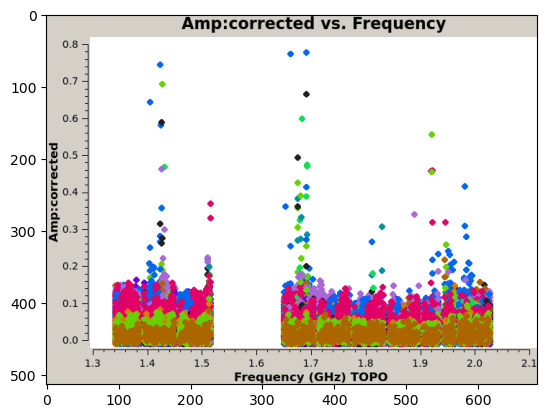

QSO J2356+0017


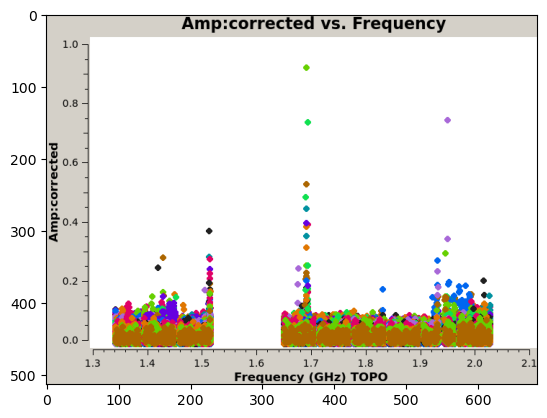

QSO J2356+0023


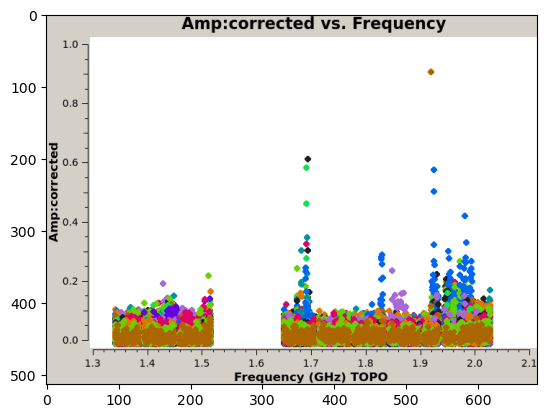

QSO J0001+0006


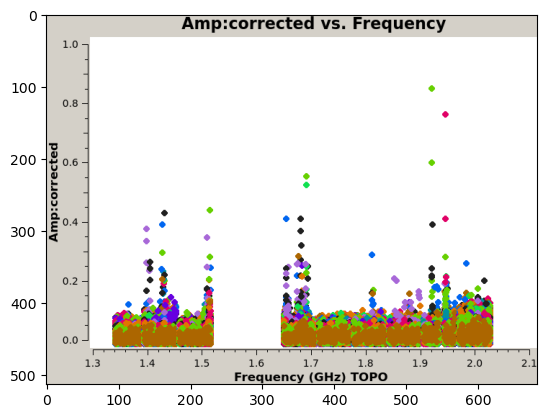

QSO J0001+0000


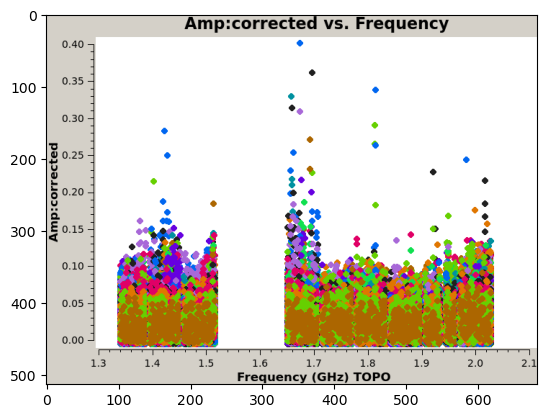

QSO J0004-0049


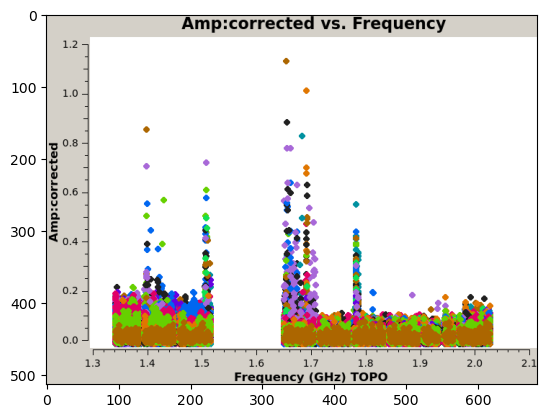

QSO J2356-0622


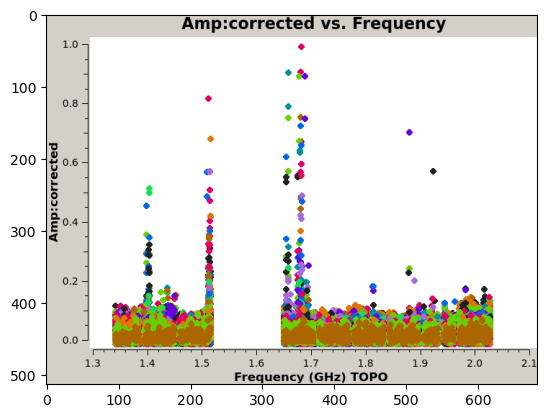

In [67]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_amp_vs_freq_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

3C48


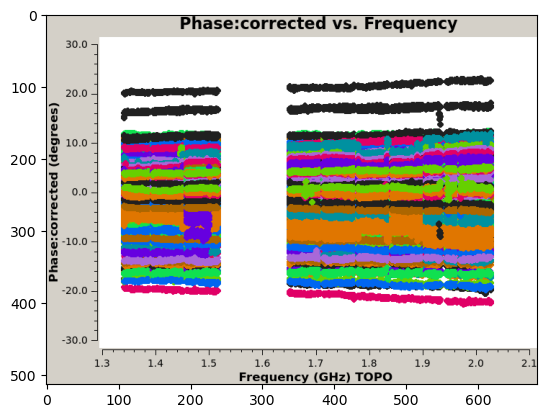

J2040-2507


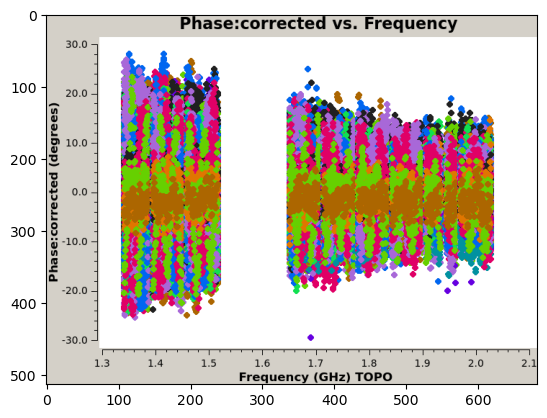

J2214-3835


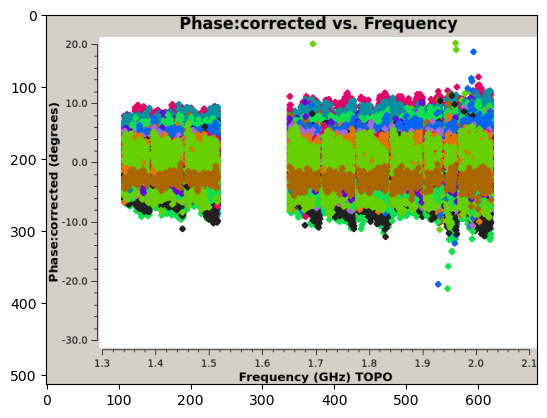

J2246-1206


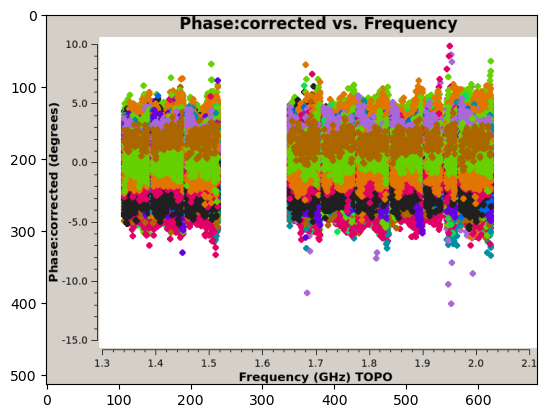

J2314-3138


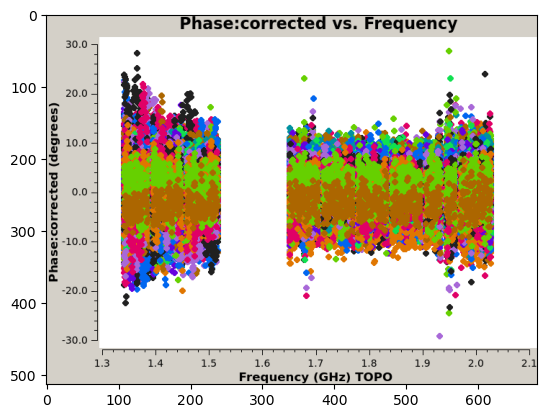

J2337-0230


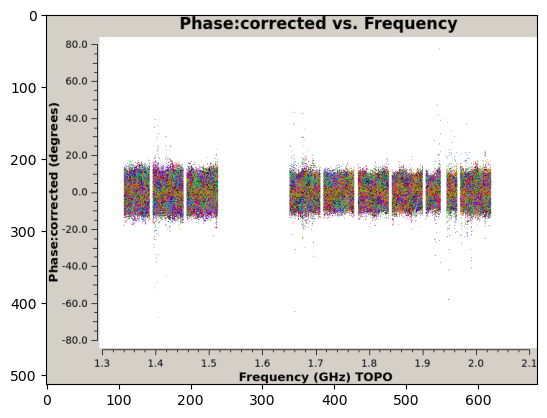

QSO J2032-2114


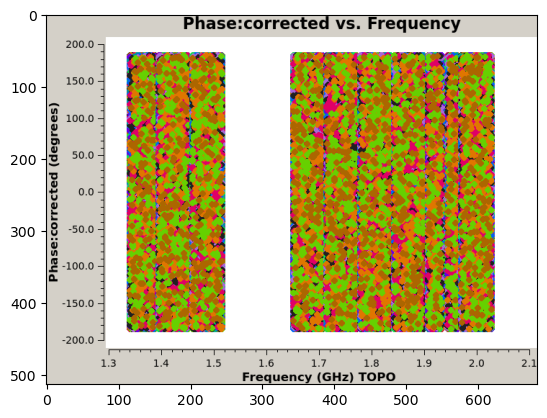

QSO J2100-1715


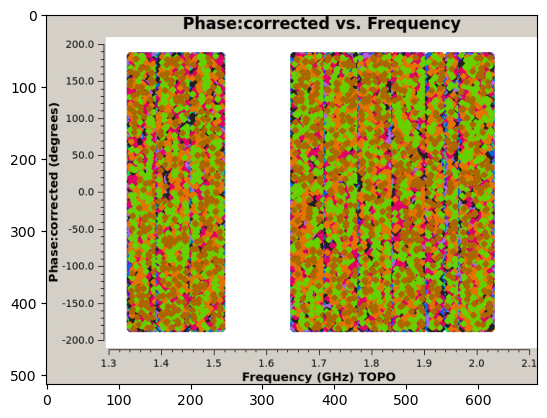

QSO J2211-3206


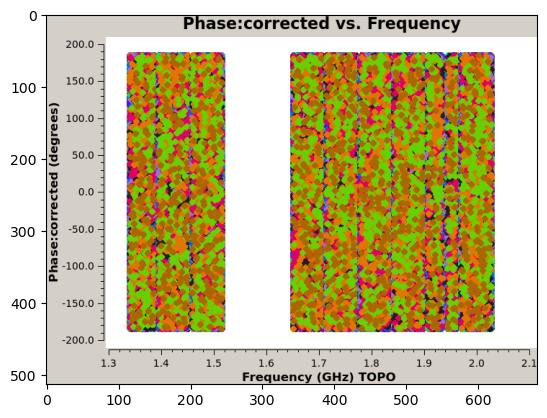

QSO J2240-1839


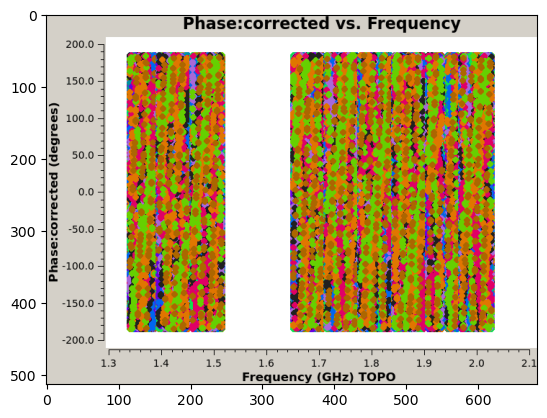

QSO J2318-3029


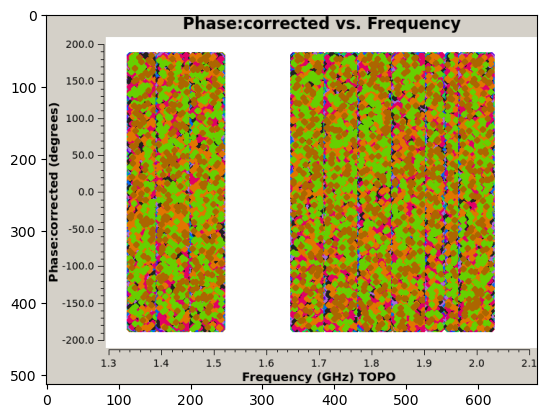

QSO J2318-3113


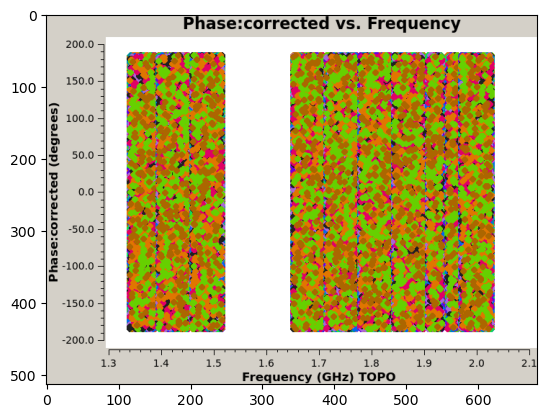

QSO J2348-3054


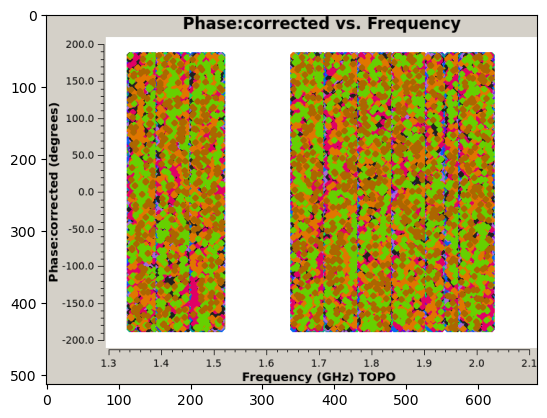

QSO J2315-0023


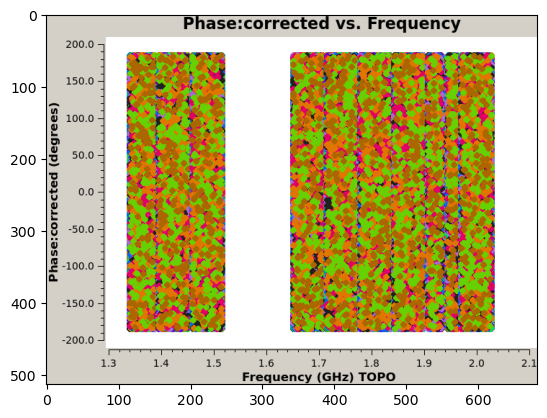

QSO J2318-0246


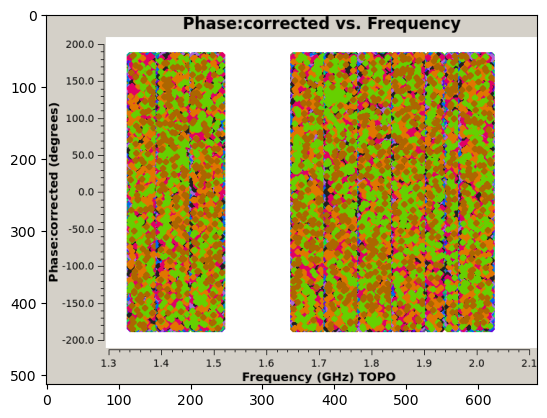

QSO J2329-0301


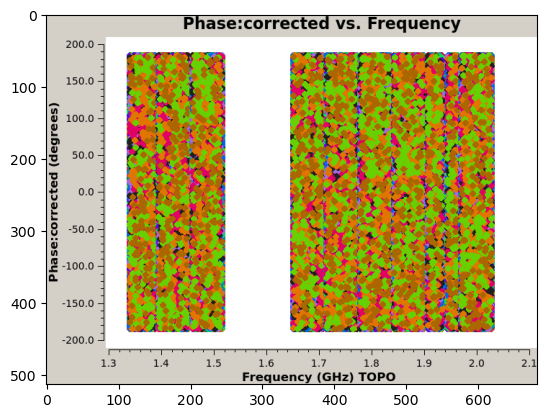

QSO J2356+0017


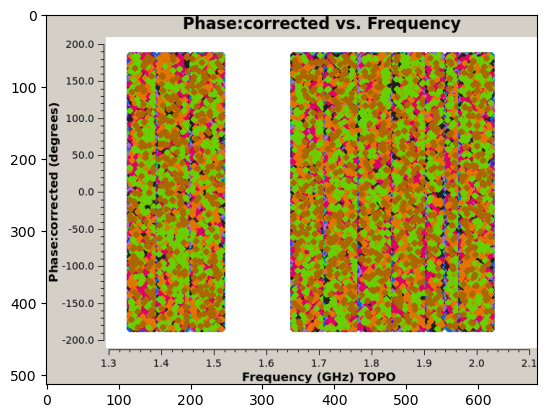

QSO J2356+0023


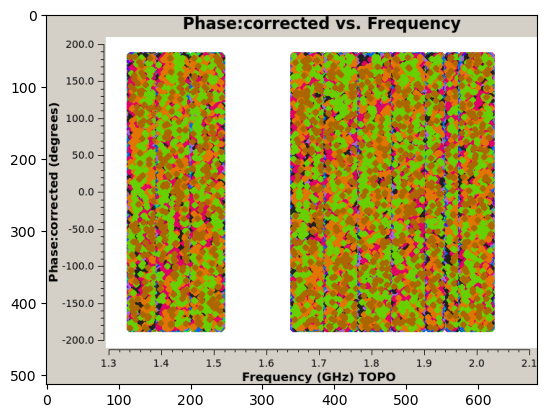

QSO J0001+0006


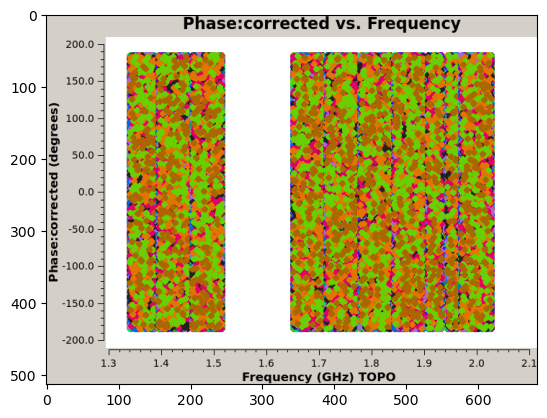

QSO J0001+0000


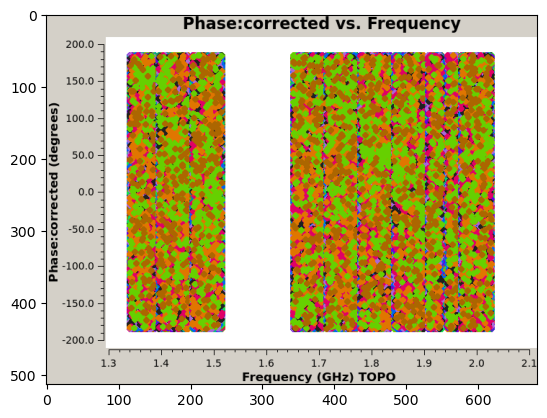

QSO J0004-0049


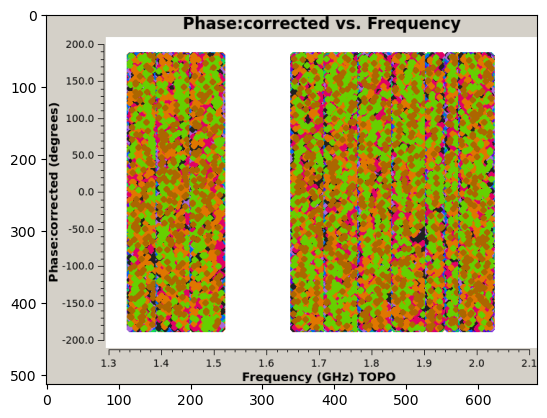

QSO J2356-0622


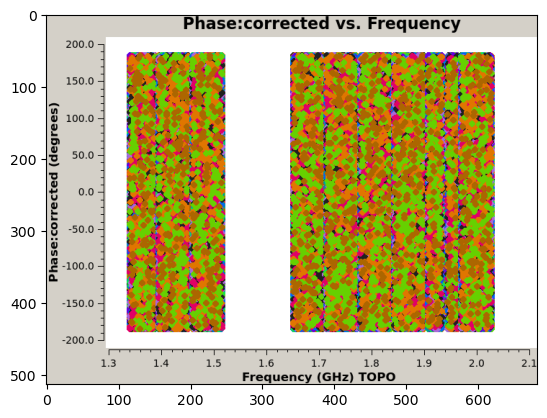

In [68]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_phase_vs_freq_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

In [69]:

with h5py.File(root + f"/output/z_score_corrected.h5", "r") as f:
    z_score = f["z-score avg"][()]
    flags = f["flags avg"][()]
    freq_array = f["freq array"][()]
    time_array = f["time array"][()]
    ant_pairs = f["ant pairs"][()]
    dt = f["dt"][()]

# Load time integrations per scan
ntimes_file = os.path.join(root, f"output/ntimes.txt")
ntimes = np.loadtxt(ntimes_file).astype(int)

# time array
tisot = np.unique(Time(time_array, format="jd", scale="utc").isot)

z_score = np.ma.masked_array(z_score, mask=flags)

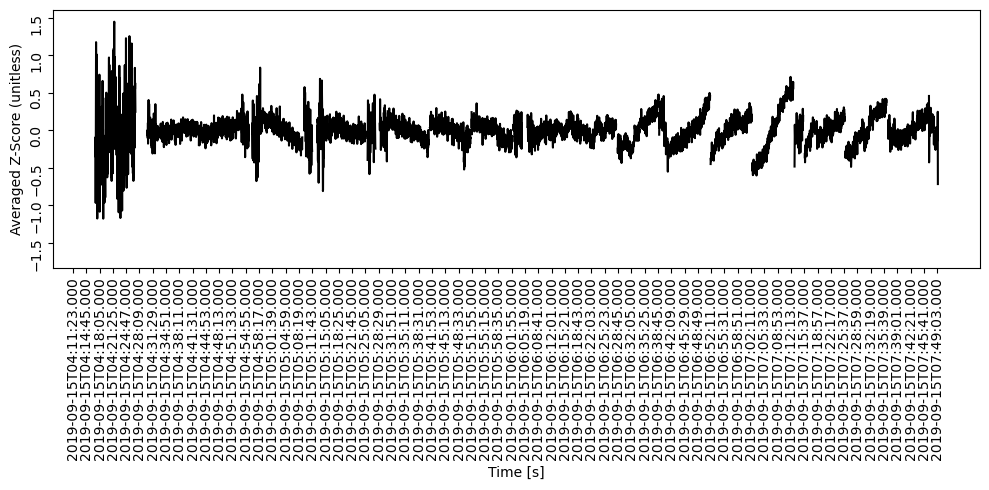

In [70]:
%matplotlib inline
fig, ax = plt.subplots(1, 1, figsize=(10, 5), sharex=True)
ax = inspect.plot_time_series(tisot, np.ma.median(z_score, axis=1), ax, plot_masked=True)
ax.set_ylabel("Averaged Z-Score (unitless)")
ax.set_xticks(tisot[::100])
plt.tight_layout()

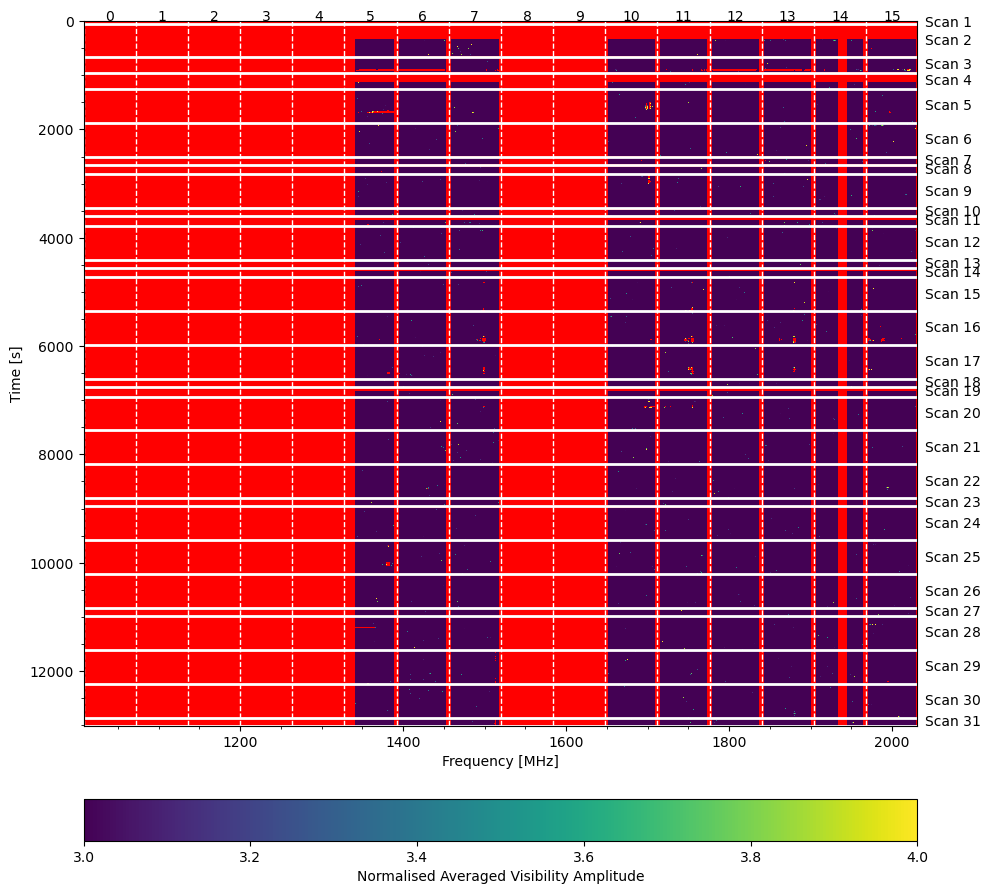

In [71]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(10, 10))
ax, im = inspect.plot_wf(freq_array, z_score, 2, ntimes, vmin=3, vmax=4, cmap=cmap, ax=ax, plot_masked=True)
fig.colorbar(im, orientation="horizontal", pad=0.08, label="Normalised Averaged Visibility Amplitude")